# Problem Statement: 

The video gaming industry is huge and shows no signs of slowing down. While there were almost two billion video gamers across the world in 2015, this figure is expected to rise to over three billion gamers by 2023.
Gamers across the globe

The Asia Pacific region is at the heart of the global video gaming industry. According to estimates, there were over 1.5 billion video gamers in the region in 2020, generating a combined revenue of 78.3 billion U.S. dollars. This represents almost double the revenue generated in the second largest region, North America. Given how much money the average gamer devotes to their hobby, it is no wonder that the gaming industry is worth billions – gamers worldwide spent an average of over 123 U.S. dollars on gaming over a three month period in 2018, which included purchases on full games, downloads, and supporting live streamers. PayPal seemed to be the payment method of choice for many gamers, while four percent gained access to the latest gaming releases via a bank transfer.

Gaming is not just huge in Asia Pacific as it has also gripped players throughout the United States. In 2018, gamers accounted for 66 percent of the general U.S. population, up from 58 percent just five years earlier. While gaming is classically seen as a hobby of the young and the male, data suggests that the love of gaming is shared by young and old alike. In fact, it seems that female gamers will be a force to be reckoned with in the future as they made up 41 percent of the U.S. gaming population in 2020, up from 38 percent in 2007.

Idea is to build a Predictive Machine Learning model to predict potential global users of a game by the provided customers data in order to plan the launch date of an upcoming Game.

## Importing Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

#Importing Visualising Libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes = True)
import missingno as msno
from pandas_profiling import ProfileReport

#Importing DataCleaning Libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder


#Importing Predictive Models 
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from scipy.stats import uniform 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import RandomizedSearchCV
import statsmodels.formula.api as smf

#Importing model evaluation metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score

#Importing Lasso and Ridge for Regularization
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV

import joblib

# Exploratory Data Analysis

In [2]:
#Loading Train Dataset

train = pd.read_csv('Train.csv')
train.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Global_Sales
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,76.0,51.0,8,322.0,Nintendo,E,82.53
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,NaN,NaN,NaN,NaN,NaN,NaN,40.24
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,82.0,73.0,8.3,709.0,Nintendo,E,35.52
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,80.0,73.0,8,192.0,Nintendo,E,32.77
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,NaN,NaN,NaN,NaN,NaN,NaN,31.37


In [3]:
# Shape of Train dataset
print('Shape of our Dataset is Rows: {} Columns: {}'.format(train.shape[0], train.shape[1]))

Shape of our Dataset is Rows: 14576 Columns: 15


In [4]:
#Analsying the dtypes of the variables

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14576 entries, 0 to 14575
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             14574 non-null  object 
 1   Platform         14576 non-null  object 
 2   Year_of_Release  14344 non-null  float64
 3   Genre            14574 non-null  object 
 4   Publisher        14527 non-null  object 
 5   NA_Sales         14576 non-null  float64
 6   EU_Sales         14576 non-null  float64
 7   JP_Sales         14576 non-null  float64
 8   Critic_Score     7217 non-null   float64
 9   Critic_Count     7217 non-null   float64
 10  User_Score       8760 non-null   object 
 11  User_Count       6796 non-null   float64
 12  Developer        8829 non-null   object 
 13  Rating           8704 non-null   object 
 14  Global_Sales     14576 non-null  float64
dtypes: float64(8), object(7)
memory usage: 1.7+ MB


In [5]:
#Checking for duplicate rows

train.duplicated().sum()

0

In [6]:
#Checking for null values

print("\nMissing values in our features:\n \n",train.isna().sum())


Missing values in our features:
 
 Name                  2
Platform              0
Year_of_Release     232
Genre                 2
Publisher            49
NA_Sales              0
EU_Sales              0
JP_Sales              0
Critic_Score       7359
Critic_Count       7359
User_Score         5816
User_Count         7780
Developer          5747
Rating             5872
Global_Sales          0
dtype: int64


In [7]:
#Checking for null Values to treat them

print("\nMissing values in percentage:\n\n",train.isnull().sum()/train.shape[0]*100)



Missing values in percentage:

 Name                0.013721
Platform            0.000000
Year_of_Release     1.591658
Genre               0.013721
Publisher           0.336169
NA_Sales            0.000000
EU_Sales            0.000000
JP_Sales            0.000000
Critic_Score       50.487102
Critic_Count       50.487102
User_Score         39.901207
User_Count         53.375412
Developer          39.427827
Rating             40.285401
Global_Sales        0.000000
dtype: float64


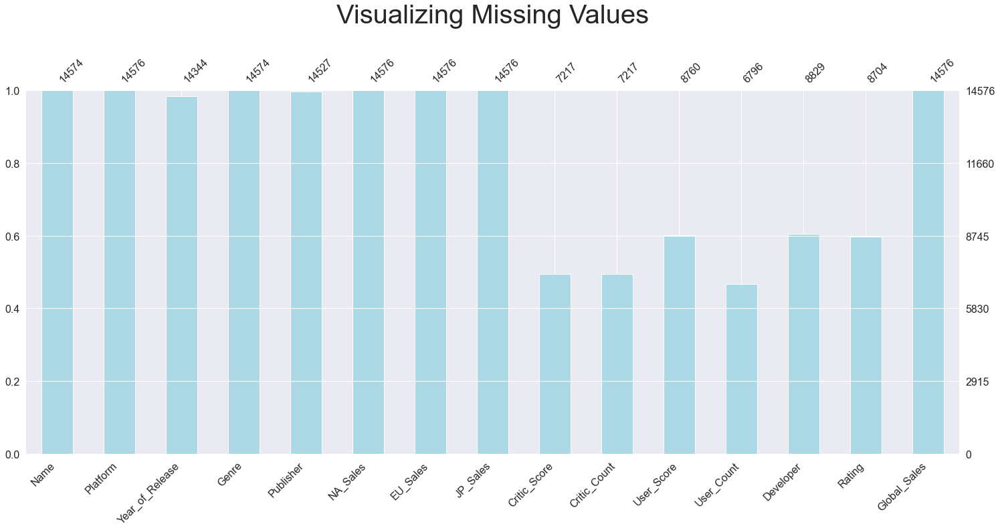

In [8]:
#Visualizing missing values
plt.figure(figsize = (10,15))
msno.bar(train,color = 'lightblue')
plt.title("Visualizing Missing Values\n", fontsize = 40)
plt.show()

In [9]:
#Statistical Analysis of Numerical Data

train.describe()


,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Count,Global_Sales
count,14344.000000,14576.000000,14576.000000,14576.000000,7217.000000,7217.000000,6796.000000,14576.000000
mean,2006.437117,0.295577,0.163957,0.085659,69.676043,27.312041,172.513096,0.598972
std,5.955664,0.866491,0.536354,0.329646,13.773391,19.464196,576.609716,1.647699
min,1980.000000,0.000000,0.000000,0.000000,13.000000,3.000000,4.000000,0.010000
25%,2003.000000,0.000000,0.000000,0.000000,61.000000,12.000000,11.000000,0.050000
50%,2007.000000,0.100000,0.030000,0.000000,71.000000,22.000000,27.000000,0.220000
75%,2010.000000,0.280000,0.130000,0.030000,80.000000,38.000000,89.000000,0.550000
max,2020.000000,41.360000,28.960000,10.220000,98.000000,113.000000,10665.000000,82.530000


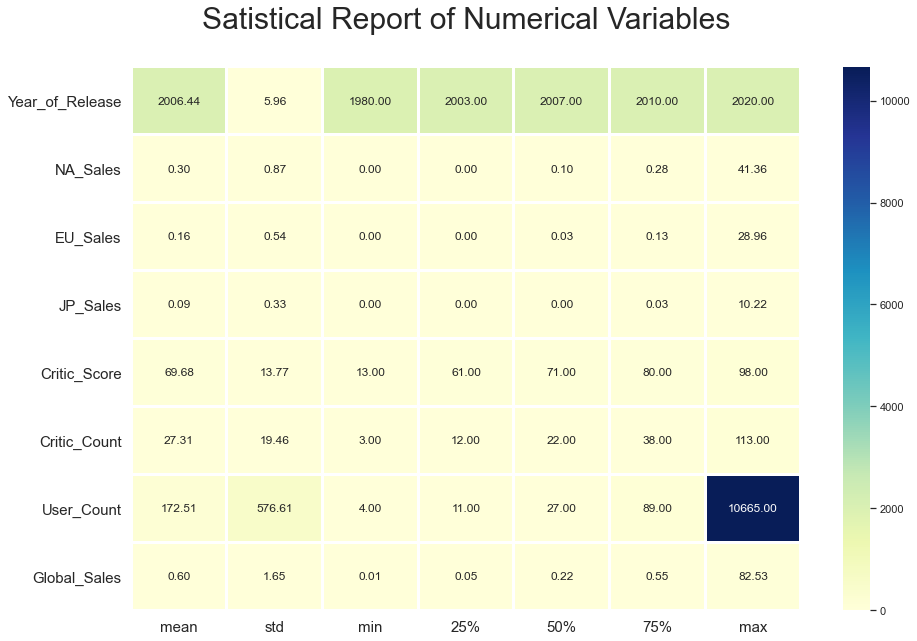

In [10]:
#visualizing statistical description of dataset
plt.figure(figsize = (15,10))
sns.heatmap(round(train.describe()[1:].transpose(),2),linewidth = 2,annot= True, fmt = "0.2f",cmap='YlGnBu')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title("Satistical Report of Numerical Variables\n",fontsize = 30)
plt.show()

In [12]:
#Splitting Continuous and Categorical Variables

catg = train.select_dtypes("object")
cont = train.select_dtypes("number")

In [13]:
print(catg.columns)
print(cont.columns)

Index(['Name', 'Platform', 'Genre', 'Publisher', 'User_Score', 'Developer',
       'Rating'],
      dtype='object')
Index(['Year_of_Release', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Critic_Score',
       'Critic_Count', 'User_Count', 'Global_Sales'],
      dtype='object')


# Data Visualization

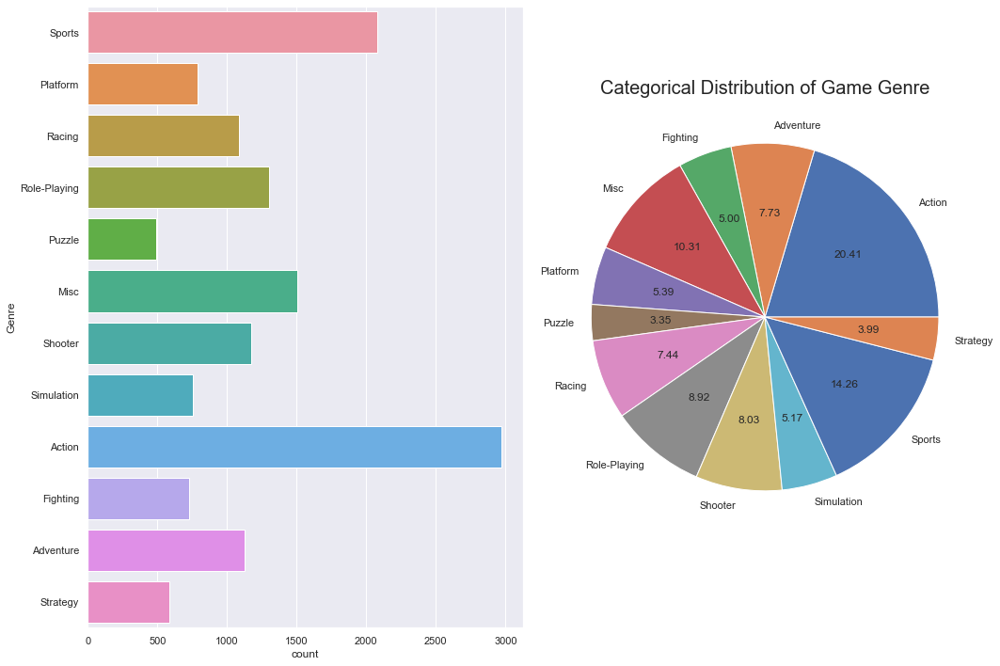

In [14]:
fig, ax = plt.subplots(1,2, figsize = (15,10))

sns.countplot(data = train, y = 'Genre', ax = ax[0])

train.groupby('Genre').size().plot(kind='pie', autopct='%.2f', ax =ax[1])
plt.title("Categorical Distribution of Game Genre", fontsize = 20)
plt.yticks(None)
plt.ylabel(None)
plt.tight_layout()
plt.show()

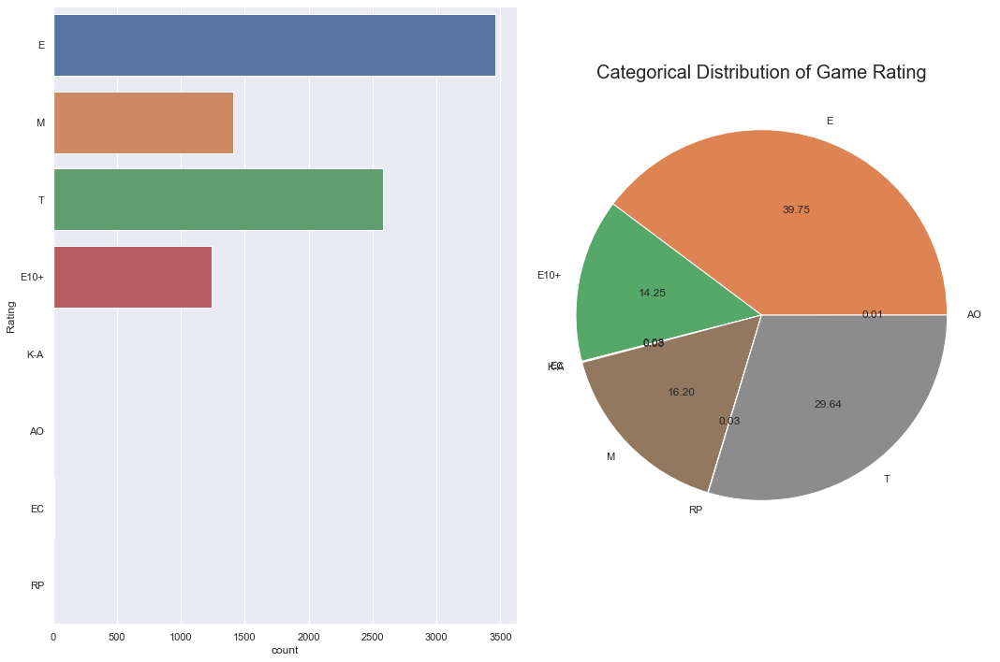

In [15]:
fig, ax = plt.subplots(1,2, figsize = (15,10))

sns.countplot(data = train, y = 'Rating', ax = ax[0])

train.groupby('Rating').size().plot(kind='pie', autopct='%.2f', ax =ax[1])
plt.title("Categorical Distribution of Game Rating", fontsize = 20)
plt.yticks(None)
plt.ylabel(None)
plt.tight_layout()
plt.show()

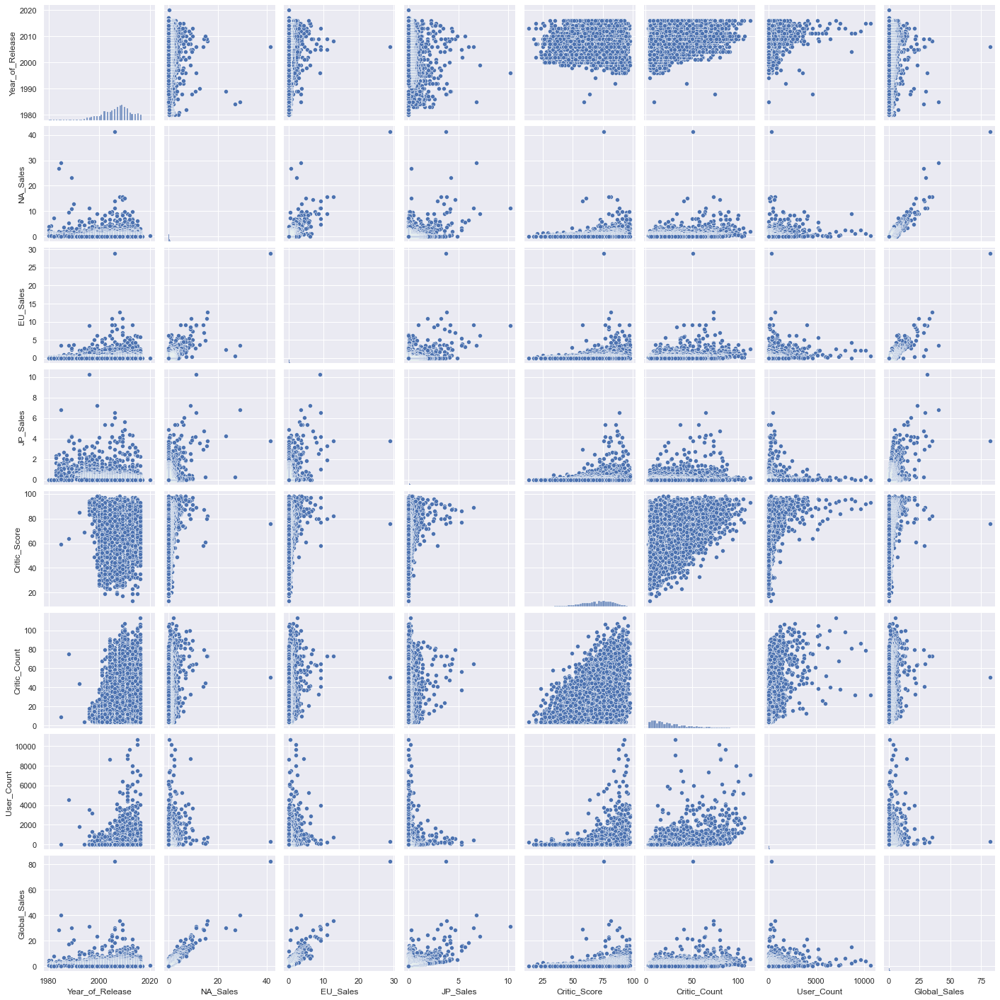

In [16]:
sns.pairplot(train)

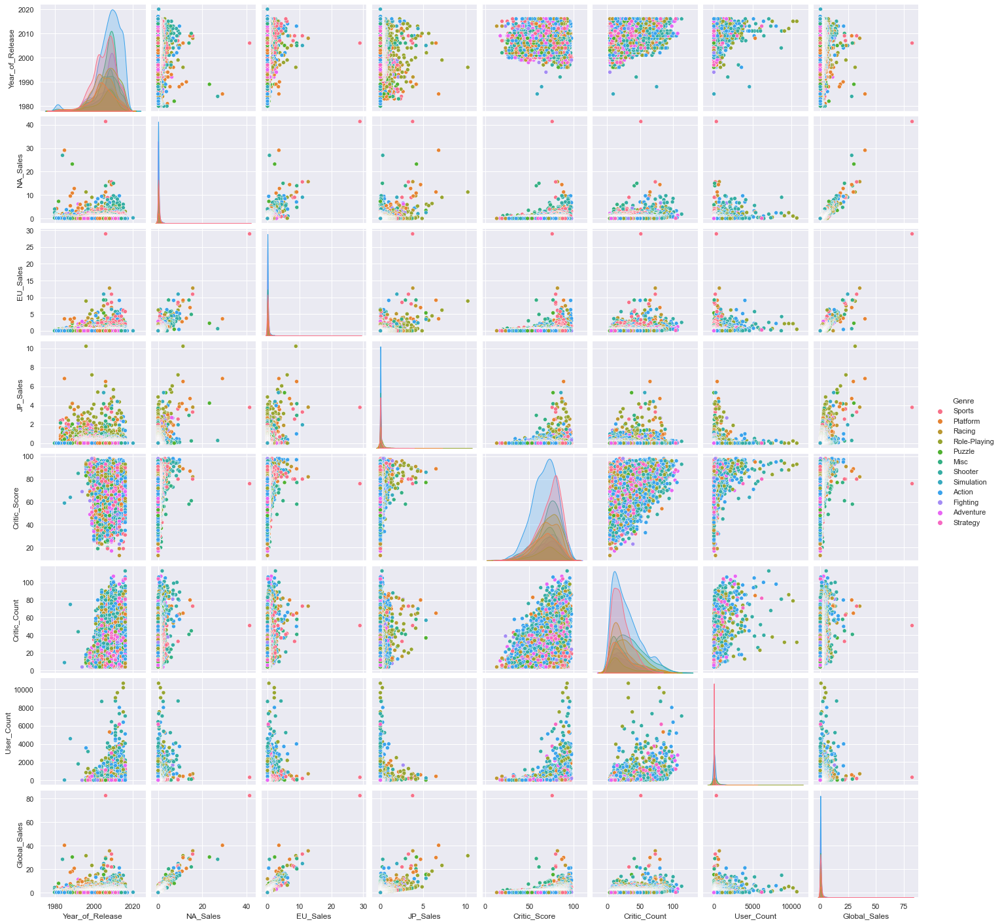

In [17]:
sns.pairplot(train,hue='Genre')

In [19]:
report = ProfileReport(train,title = 'Video Games Report')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
publishercol = train.drop(columns = ['Year_of_Release', 'Genre', 'Name','Platform'])
publishersum = publishercol.groupby('Publisher').sum()
publishersum = publishersum.sort_values(by=['Global_Sales'], ascending=False).head(10)
publishersum = publishersum.rename(index={'Electronic Arts':'EA',
                                    'Sony Computer Entertainment': 'Sony',
                                    'Take-Two Interactive': 'Take-Two',
                                    'Konami Digital Entertainment':'Konami',
                                    'Namco Bandai Games':'Namco'})
publishersum

,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Count,Global_Sales
Publisher,,,,,,,
Nintendo,816.62,418.75,456.10,23042.0,12868.0,57805.0,1786.11
EA,594.47,371.43,14.18,72485.0,27080.0,165039.0,1108.62
Activision,425.16,214.12,6.71,37512.0,14873.0,120141.0,721.13
Sony,264.25,185.11,72.49,24288.0,12394.0,87750.0,600.92
Ubisoft,244.74,159.38,7.21,34032.0,12972.0,83848.0,459.73
Take-Two,219.89,118.47,5.93,20245.0,9026.0,108874.0,399.61
THQ,202.49,92.17,5.01,24433.0,8091.0,27422.0,331.20
Konami,87.83,67.60,86.44,19569.0,6432.0,29988.0,271.48
Sega,106.15,79.67,51.89,19274.0,8513.0,32718.0,261.36


In [21]:
publishermean = publishersum.drop(columns = 'Global_Sales')
publishermean = publishermean.mean(axis=1) 
publishermean

Publisher
Nintendo                  15901.078333
EA                        44264.013333
Activision                28861.998333
Sony                      20825.641667
Ubisoft                   21877.221667
Take-Two                  23081.548333
THQ                       10040.945000
Konami                     9371.811667
Sega                      10123.785000
Microsoft Game Studios    12018.511667
dtype: float64

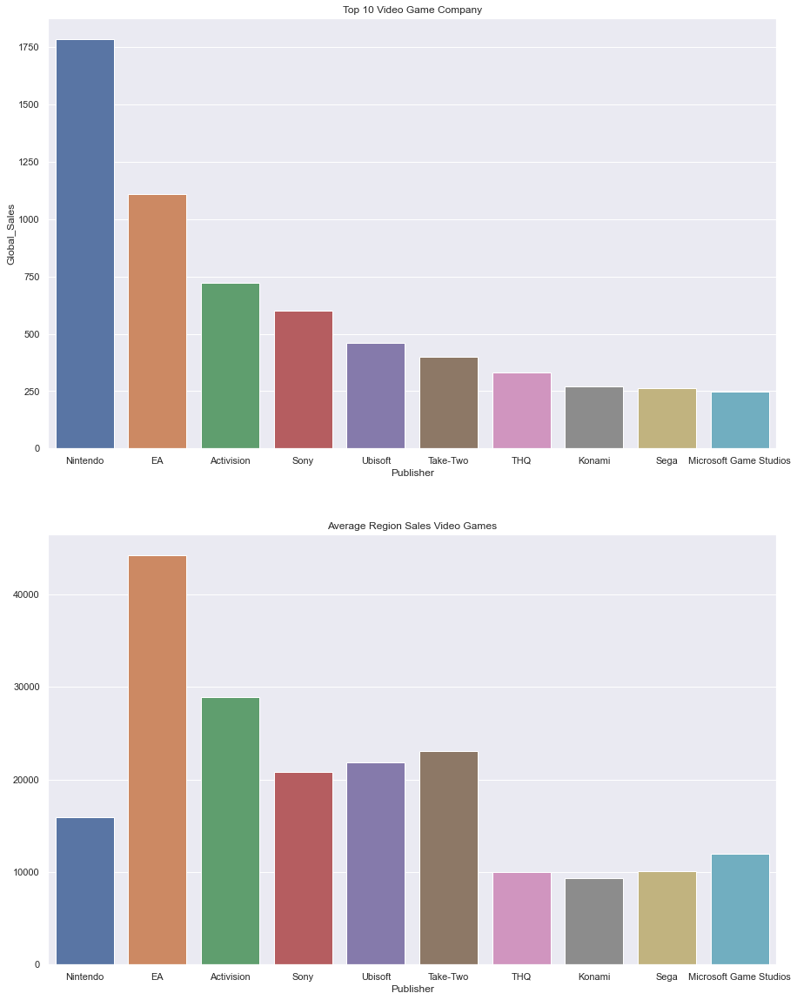

In [22]:
fig, ax = plt.subplots(2,1, figsize=(15,20))

sns.barplot(x=publishersum.index, y=publishersum['Global_Sales'], ax=ax[0])
# sns.set_style("whitegrid")
ax[0].set_title('Top 10 Video Game Company')

sns.barplot(x=publishermean.index, y=publishermean, ax=ax[1])
# sns.set_style("darkgrid")
ax[1].set_title('Average Region Sales Video Games')
plt.show()

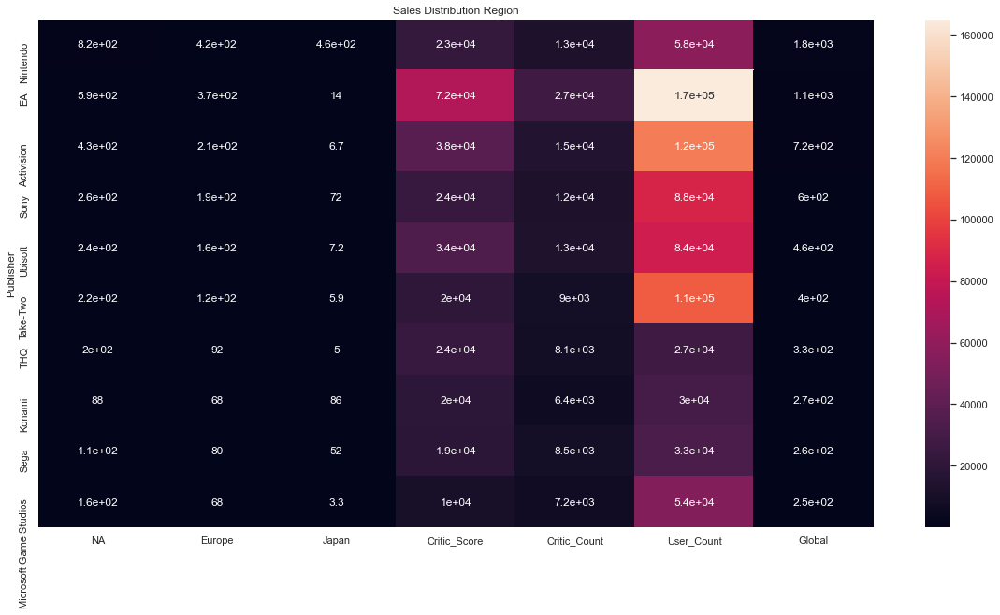

In [23]:
publisherheatmap = publishersum.rename(columns={'NA_Sales':'NA',
                                    'EU_Sales': 'Europe',
                                    'JP_Sales': 'Japan',
                                    'Other_Sales':'Other',
                                    'Global_Sales':'Global'})
plt.figure(figsize = (20,10))
sns.heatmap(publisherheatmap, annot = True)
plt.title('Sales Distribution Region')
plt.show()

In [24]:
genrecounts = train.groupby('Genre').count()
genrecounts = genrecounts.rename(index={'Role-Playing':'Roleplay'})
genrecounts = genrecounts.sort_values('NA_Sales', ascending=False)
genrecounts

,Name,Platform,Year_of_Release,Publisher,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Global_Sales
Genre,,,,,,,,,,,,,,
Action,2974,2974,2919,2969,2974,2974,2974,1689,1689,1958,1642,1972,1943,2974
Sports,2078,2078,2040,2075,2078,2078,2078,1090,1090,1363,1025,1370,1357,2078
Misc,1503,1503,1479,1477,1503,1503,1503,472,472,761,404,760,756,1503
Roleplay,1300,1300,1284,1299,1300,1300,1300,658,658,687,662,700,691,1300
Shooter,1171,1171,1147,1169,1171,1171,1171,844,844,913,832,914,909,1171
Adventure,1127,1127,1119,1123,1127,1127,1127,265,265,379,249,388,368,1127
Racing,1084,1084,1065,1083,1084,1084,1084,651,651,754,572,762,750,1084
Platform,786,786,777,785,786,786,786,434,434,491,373,493,493,786
Simulation,753,753,742,751,753,753,753,315,315,500,312,504,490,753


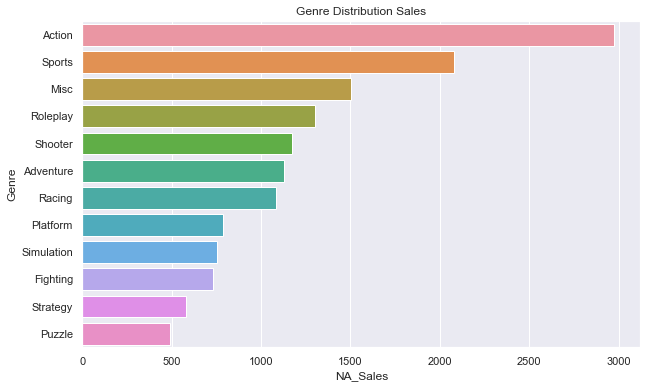

In [25]:
plt.figure(figsize=(10,6))
plt.title("Genre Distribution Sales")
sns.barplot(x=genrecounts['NA_Sales'], y=genrecounts.index)
sns.set_style("darkgrid")

In [33]:
yeargrowth = train.drop(columns = ['Genre', 'Name','Platform','NA_Sales','EU_Sales', 'JP_Sales','NA_Sales',
                                   'Critic_Score','Critic_Count','User_Score','User_Count','Developer','Rating'])
yeargrowth

,Year_of_Release,Publisher,Global_Sales
0,2006.0,Nintendo,82.53
1,1985.0,Nintendo,40.24
2,2008.0,Nintendo,35.52
3,2009.0,Nintendo,32.77
4,1996.0,Nintendo,31.37
...,...,...,...
14571,2016.0,Tecmo Koei,0.01
14572,2006.0,Codemasters,0.01
14573,2016.0,Idea Factory,0.01
14574,2003.0,Wanadoo,0.01


In [34]:
nintendogrow = yeargrowth[yeargrowth['Publisher'] == 'Nintendo']
eagrow = yeargrowth[yeargrowth['Publisher'] == 'Electronic Arts']
activisiongrow = yeargrowth[yeargrowth['Publisher'] == 'Activision']
sonygrow = yeargrowth[yeargrowth['Publisher'] == 'Sony Computer Entertainment']

Text(0.5, 1.0, 'Sony Sales Growth')

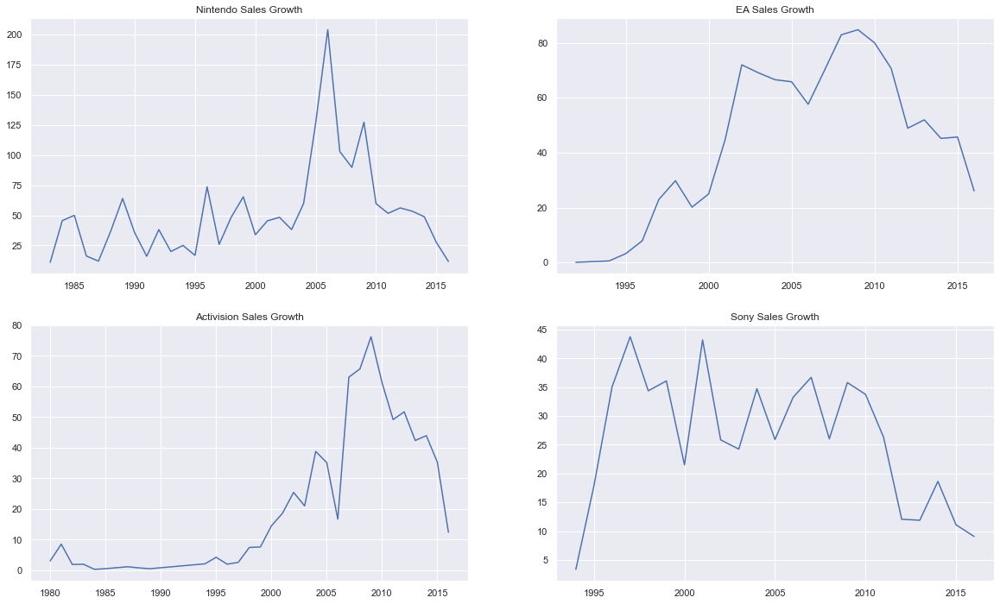

In [35]:
fig, ax = plt.subplots(2,2,figsize=(20,12))

nintendogrow = nintendogrow.groupby('Year_of_Release').sum()
eagrow = eagrow.groupby('Year_of_Release').sum()
activisiongrow = activisiongrow.groupby('Year_of_Release').sum()
sonygrow = sonygrow.groupby('Year_of_Release').sum()

ax[0,0].plot(nintendogrow)
ax[0,0].set_title('Nintendo Sales Growth')

ax[0,1].plot(eagrow)
ax[0,1].set_title('EA Sales Growth')

ax[1,0].plot(activisiongrow)
ax[1,0].set_title('Activision Sales Growth')

ax[1,1].plot(sonygrow)
ax[1,1].set_title('Sony Sales Growth')

In [37]:
platform = train.drop(columns = ['Genre', 'Name','Year_of_Release','Publisher','NA_Sales','EU_Sales', 'JP_Sales','NA_Sales'])
platform = platform.groupby('Platform').count()
platform = platform.sort_values('Global_Sales', ascending=False)
platform = platform.head(10)
# platform = platform['Platform'].value_counts()
# platform = platform.head(10)
platform 

,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Global_Sales
Platform,,,,,,,
PS2,1172,1172,1330,1125,1330,1330,1935
DS,594,594,1039,438,1046,1041,1783
PS3,774,774,896,828,899,884,1209
Wii,516,516,861,505,868,863,1138
X360,840,840,949,886,959,950,1135
PS,186,186,192,151,198,194,1058
PSP,407,407,473,375,478,473,1049
PC,636,636,729,683,738,689,874
GBA,389,389,450,229,454,454,712


<AxesSubplot:title={'center':'Platform Distribution Sales'}, xlabel='Platform', ylabel='Global_Sales'>

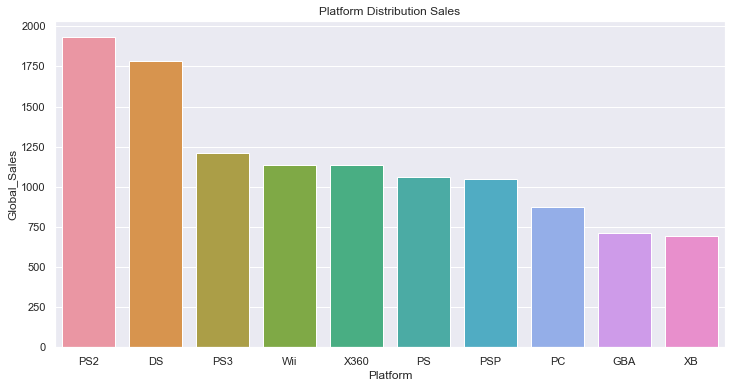

In [38]:
plt.figure(figsize=(12,6))
plt.title("Platform Distribution Sales")
diverging_colors = sns.color_palette("hls", 8)
sns.set_palette(diverging_colors)
sns.barplot(x=platform.index, y=platform['Global_Sales'])

# sns.set_style("darkgrid")

In [41]:
gblSaleByGenreAll = train[["Genre","Global_Sales"]].groupby(["Genre"]).sum().reset_index()
gblSaleByGenreAll.sort_values(by="Genre", ascending=False)
gblSaleByGenreAll

,Genre,Global_Sales
0,Action,1710.46
1,Adventure,223.03
2,Fighting,436.89
3,Misc,781.53
4,Platform,818.60
5,Puzzle,234.94
6,Racing,713.68
7,Role-Playing,916.72
8,Shooter,1039.50
9,Simulation,380.10


In [42]:
gblSaleByPublisherAll = train[["Publisher","Global_Sales"]].groupby(["Publisher"]).sum().reset_index()
gblSaleByPublisherAll.sort_values(by="Publisher", ascending=False)
gblSaleByPublisherAll

,Publisher,Global_Sales
0,10TACLE Studios,0.05
1,1C Company,0.10
2,20th Century Fox Video Games,1.94
3,2D Boy,0.04
4,3DO,9.38
...,...,...
547,id Software,0.03
548,imageepoch Inc.,0.04
549,inXile Entertainment,0.10
550,"mixi, Inc",0.87


In [43]:
gblSaleByDeveloperAll = train[["Developer","Global_Sales"]].groupby(["Developer"]).sum().reset_index()
gblSaleByDeveloperAll.sort_values(by="Developer", ascending=False)
gblSaleByDeveloperAll

,Developer,Global_Sales
0,10tacle Studios,0.16
1,"10tacle Studios, Fusionsphere Systems",0.05
2,"1C, 1C Company",0.03
3,"1C, Ino-Co, 1C Company",0.05
4,"1C, Various, 1C Company",0.01
...,...,...
1572,neo Software,1.22
1573,odenis studio,0.09
1574,oeFun,0.02
1575,syn Sophia,3.31


In [44]:
gblSaleByPlatformAll = train[["Platform","Global_Sales"]].groupby(["Platform"]).sum().reset_index()
gblSaleByPlatformAll.sort_values(by="Global_Sales", ascending=True)
gblSaleByPlatformAll

,Platform,Global_Sales
0,2600,96.80
1,3DO,0.10
2,3DS,250.96
3,DC,14.95
4,DS,775.14
5,GB,254.93
6,GBA,309.27
7,GC,190.51
8,GEN,30.16
9,GG,0.04


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38]),
 [Text(0, 0, '1980.0'),
  Text(1, 0, '1981.0'),
  Text(2, 0, '1982.0'),
  Text(3, 0, '1983.0'),
  Text(4, 0, '1984.0'),
  Text(5, 0, '1985.0'),
  Text(6, 0, '1986.0'),
  Text(7, 0, '1987.0'),
  Text(8, 0, '1988.0'),
  Text(9, 0, '1989.0'),
  Text(10, 0, '1990.0'),
  Text(11, 0, '1991.0'),
  Text(12, 0, '1992.0'),
  Text(13, 0, '1993.0'),
  Text(14, 0, '1994.0'),
  Text(15, 0, '1995.0'),
  Text(16, 0, '1996.0'),
  Text(17, 0, '1997.0'),
  Text(18, 0, '1998.0'),
  Text(19, 0, '1999.0'),
  Text(20, 0, '2000.0'),
  Text(21, 0, '2001.0'),
  Text(22, 0, '2002.0'),
  Text(23, 0, '2003.0'),
  Text(24, 0, '2004.0'),
  Text(25, 0, '2005.0'),
  Text(26, 0, '2006.0'),
  Text(27, 0, '2007.0'),
  Text(28, 0, '2008.0'),
  Text(29, 0, '2009.0'),
  Text(30, 0, '2010.0'),
  Text(31, 0, '2011.0'),
  Text(32, 0, '2012.0'),
  T

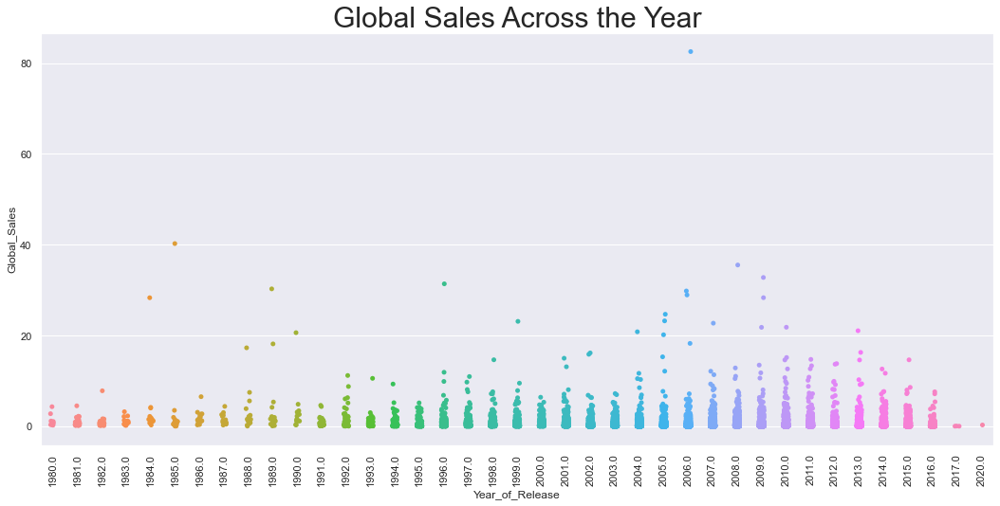

In [45]:
plt.figure(figsize=(18,8))
sns.stripplot(data = train, x = 'Year_of_Release', y = 'Global_Sales')
plt.title("Global Sales Across the Year", fontsize = 30)
plt.xticks(rotation = 90)

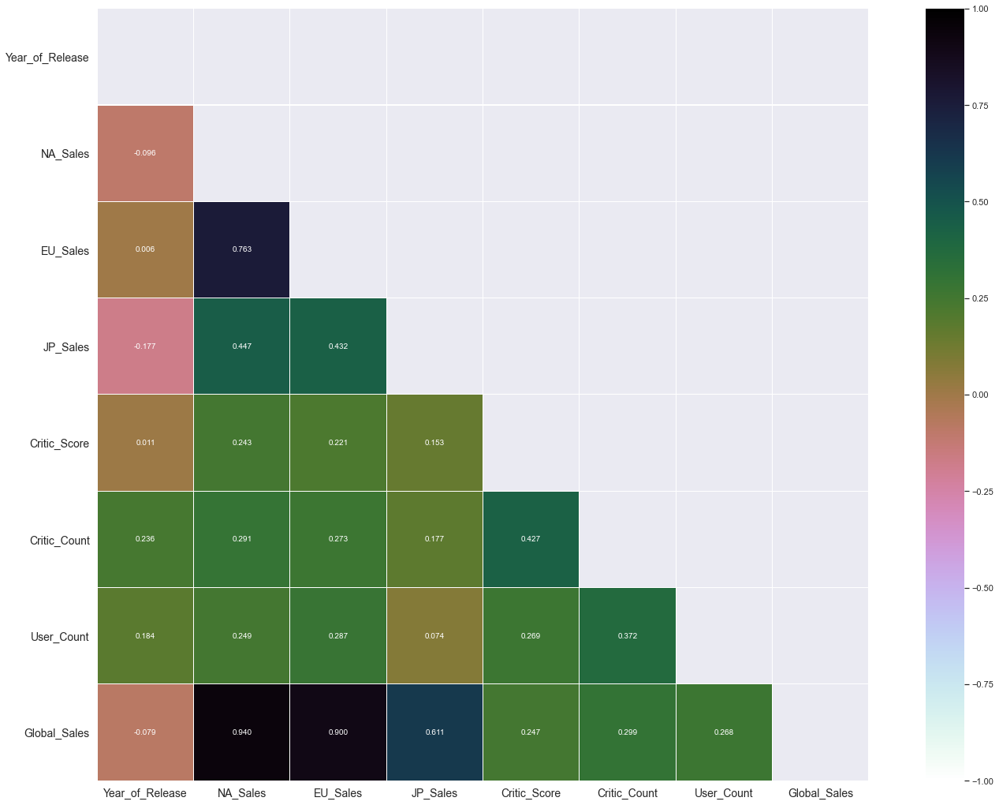

In [46]:
## Correlation Matrix
upper_triangle = np.triu(train.corr())
plt.figure(figsize=(26,18))
sns.heatmap(train.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', linewidth=0.1, 
            annot_kws={'size':10}, cmap="cubehelix_r", mask=upper_triangle)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14,rotation=0)
plt.show()

# Data Cleaning

In [47]:
train.User_Score.fillna('tbd',inplace= True)
train.User_Score.replace('tbd',0,inplace = True)

In [48]:
train['User_Score'] = train.User_Score.astype('float64')

In [49]:
(train['User_Score']).mean()

3.334886114160283

In [50]:
(train['User_Score']) = (train['User_Score']).replace(0,(train['User_Score']).mean())

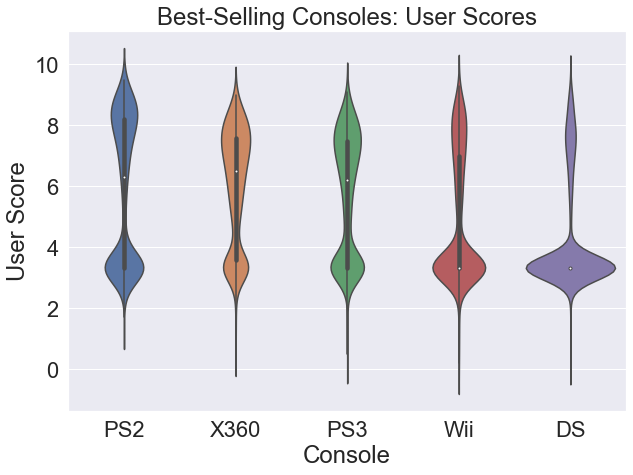

In [51]:
# create and display plot of user score vs console
plt.figure(figsize=(10,7))
sns.set(font_scale=2)
ax = sns.violinplot(x='Platform', y='User_Score', data=train, order=['PS2','X360', 'PS3', 'Wii', 'DS'])
ax.set(xlabel='Console', ylabel='User Score', title='Best-Selling Consoles: User Scores')
plt.show()

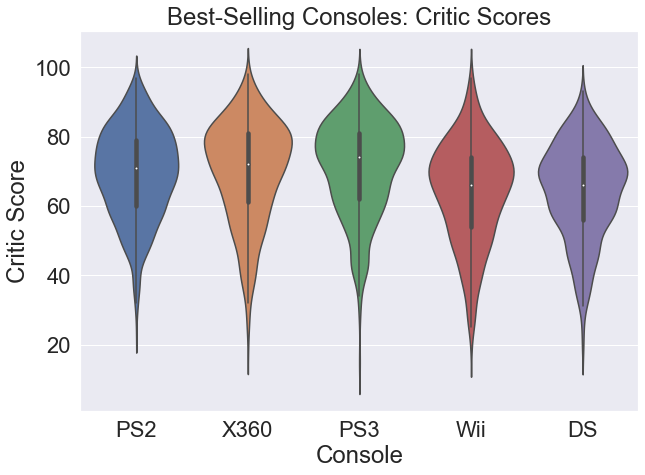

In [52]:
# create and display plot of critic score vs console
plt.figure(figsize=(10,7))
sns.set(font_scale=2)
ax = sns.violinplot(x='Platform', y='Critic_Score', data=train, order=['PS2','X360', 'PS3', 'Wii', 'DS'])
ax.set(xlabel='Console', ylabel='Critic Score', title='Best-Selling Consoles: Critic Scores')
plt.show()

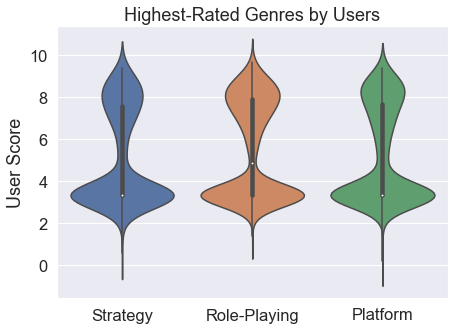

In [53]:
# create and display plot of user rating vs top genres
plt.figure(figsize=(7,5))
sns.set(font_scale=1.5)
ax = sns.violinplot(x='Genre', y='User_Score', data=train, order=['Strategy', 'Role-Playing', 'Platform'])
ax.set(ylabel='User Score', title='Highest-Rated Genres by Users', xlabel = '')
plt.show()

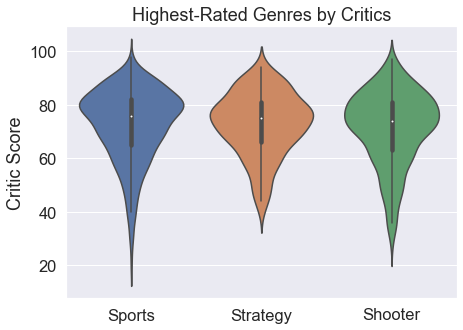

In [54]:
# create and display plot of critic rating vs top genres
plt.figure(figsize=(7,5))
sns.set(font_scale=1.5)
ax = sns.violinplot(x='Genre', y='Critic_Score', data=train, order=['Sports', 'Strategy', 'Shooter'])
ax.set(xlabel='', ylabel='Critic Score', title='Highest-Rated Genres by Critics')
plt.show()

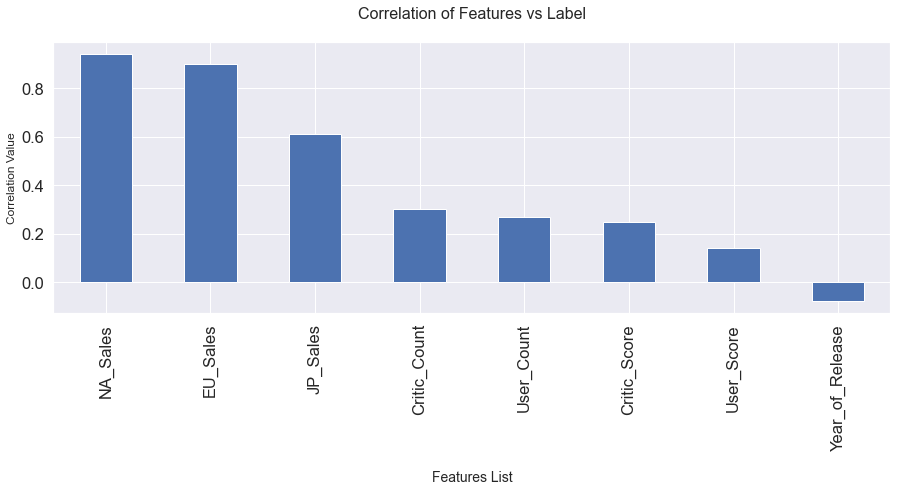

In [55]:
df_corr = train.corr()
plt.figure(figsize=(15,5))
df_corr['Global_Sales'].sort_values(ascending=False).drop('Global_Sales').plot.bar()
plt.title("Correlation of Features vs Label\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

## Dealing With Null Values

In [56]:
train.isna().sum()

Name                  2
Platform              0
Year_of_Release     232
Genre                 2
Publisher            49
NA_Sales              0
EU_Sales              0
JP_Sales              0
Critic_Score       7359
Critic_Count       7359
User_Score            0
User_Count         7780
Developer          5747
Rating             5872
Global_Sales          0
dtype: int64

In [57]:
print("Mode for Name:              ",train['Name'].mode())
print("Mode for Genre:             ",train['Genre'].mode())
print("Mode for Publisher:         ",train['Publisher'].mode())
print("Mode for Year_of_Release:   ",train['Year_of_Release'].mode())
print("Mode for Rating:            ",train['Rating'].mode())
print("Mode for Developer:         ",train['Developer'].mode())

Mode for Name:               0    Need for Speed: Most Wanted
dtype: object
Mode for Genre:              0    Action
dtype: object
Mode for Publisher:          0    Electronic Arts
dtype: object
Mode for Year_of_Release:    0    2009.0
dtype: float64
Mode for Rating:             0    E
dtype: object
Mode for Developer:          0    Ubisoft
dtype: object


In [58]:
print("Mean for Critic_Score:   ",train['Critic_Score'].mean())
print("Mean for Critic_Count:   ",train['Critic_Count'].mean())
print("Mean for User_Count:     ",train['User_Count'].mean())

Mean for Critic_Score:    69.6760426770126
Mean for Critic_Count:    27.31204101427186
Mean for User_Count:      172.51309593878753


In [59]:
#Imputing Categorical Values with mode
train['Name'] = train['Name'].replace(np.nan,'Need for Speed: Most Wanted') 
train['Genre'] = train['Genre'].replace(np.nan,'Action')
train['Publisher'] = train['Publisher'].replace(np.nan,'Electronic Arts')
train['Developer'] = train['Developer'].replace(np.nan,'Unknown')
train['Year_of_Release'] = train['Year_of_Release'].replace(np.nan,2019)


#Imputing Continuous Values with mean
train['Critic_Score'] = train['Critic_Score'].replace(np.nan,69.676)
train['Critic_Count'] = train['Critic_Count'].replace(np.nan,3.0971)
train['User_Count'] = train['User_Count'].replace(np.nan,3.640)

#Replacing Nans For Ratings with a Unique Identifier 'TBD' (To be disclosed) according to ESRP Ratings
train['Rating'] = train['Rating'].replace(np.nan,'TBD')

In [60]:
#changing datatype of Year_of_Release from float64 to int 
train['Year_of_Release'] = train['Year_of_Release'].astype('int')

In [61]:
train.isna().sum()

Name               0
Platform           0
Year_of_Release    0
Genre              0
Publisher          0
NA_Sales           0
EU_Sales           0
JP_Sales           0
Critic_Score       0
Critic_Count       0
User_Score         0
User_Count         0
Developer          0
Rating             0
Global_Sales       0
dtype: int64

## Handling Skewness

In [63]:
train.skew()

Year_of_Release    -0.878154
NA_Sales           17.712138
EU_Sales           17.763006
JP_Sales           10.498772
Critic_Score       -0.891942
Critic_Count        1.784608
User_Score          0.528857
User_Count         12.329755
Global_Sales       16.411235
dtype: float64

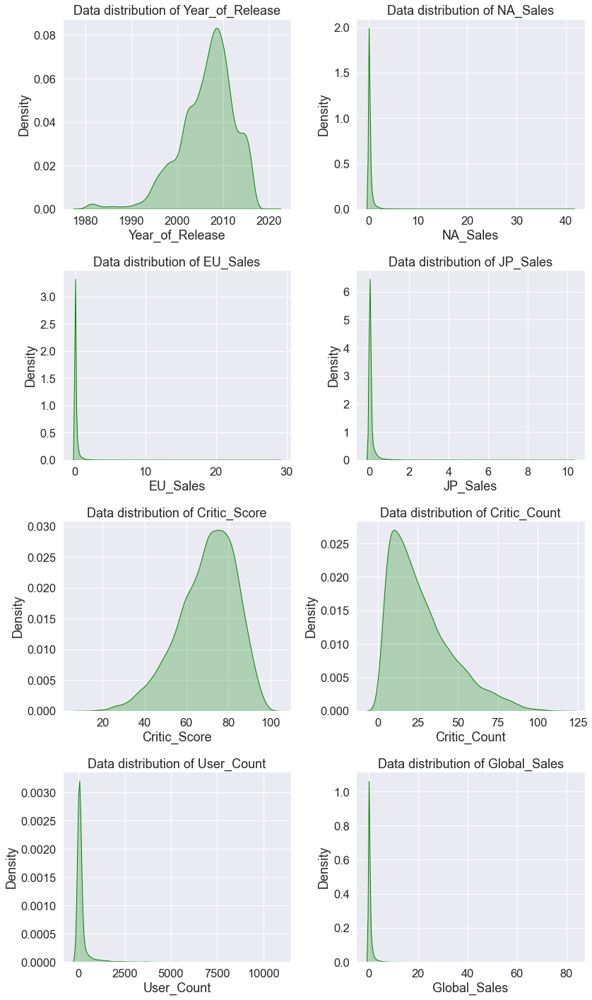

In [64]:
#Multivariate Analysis
#Visualising Data distribution of our dataset

plt.figure(figsize = (12,20), facecolor ='white')
plotnumber=1

for column in cont:
    if plotnumber<=8: 
        ax = plt.subplot(4,2,plotnumber)
        sns.kdeplot(cont[column], shade=True, color = 'green')
        plt.title('Data distribution of ' + column)
    plotnumber+=1
plt.tight_layout()

In [65]:
for col in cont:
    if train.skew().loc[col]>0.55:
        train[col]=np.log1p(train[col])

In [66]:
train.skew()

Year_of_Release   -0.878154
NA_Sales           3.180148
EU_Sales           4.047356
JP_Sales           5.121945
Critic_Score      -0.891942
Critic_Count       0.669872
User_Score         0.528857
User_Count         1.622288
Global_Sales       2.554011
dtype: float64

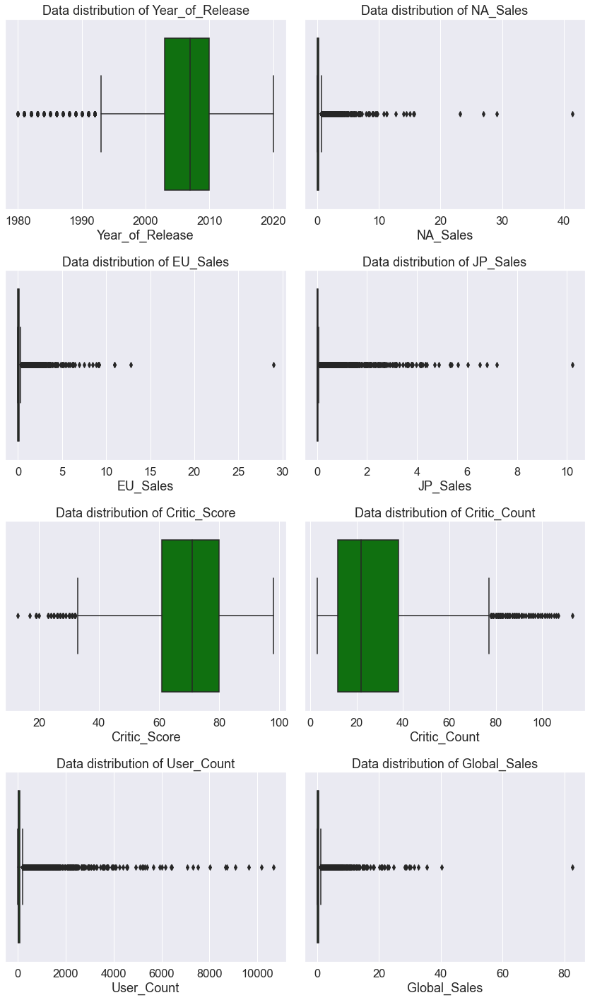

In [67]:
#Multivariate Analysis
#Visualising Data outliers of our dataset

plt.figure(figsize = (12,20), facecolor ='white')
plotnumber=1

for column in cont:
    if plotnumber<=8: 
        ax = plt.subplot(4,2,plotnumber)
        sns.boxplot(cont[column], color = 'green')
        plt.title('Data distribution of ' + column)
    plotnumber+=1
plt.tight_layout()

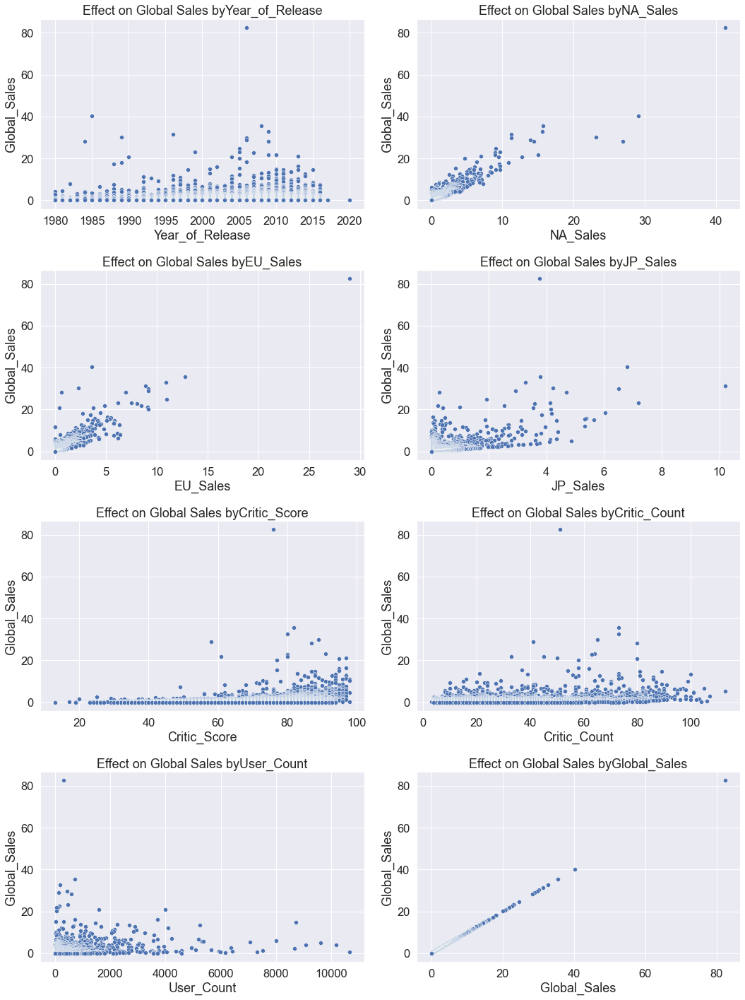

In [68]:
#Multivariate Analysis
#Visualising Data distribution of our dataset

plt.figure(figsize = (15,20), facecolor ='white')
plotnumber=1
                           
for column in cont:
    if plotnumber<=8: 
        ax = plt.subplot(4,2,plotnumber)
        sns.scatterplot(data = cont,x = cont[column],y = "Global_Sales")
        plt.title('Effect on Global Sales by' + column)
    plotnumber+=1
plt.tight_layout()

Year_of_Release       AxesSubplot(0.125,0.799681;0.133621x0.0803191)
NA_Sales           AxesSubplot(0.285345,0.799681;0.133621x0.0803191)
EU_Sales            AxesSubplot(0.44569,0.799681;0.133621x0.0803191)
JP_Sales           AxesSubplot(0.606034,0.799681;0.133621x0.0803191)
Critic_Score       AxesSubplot(0.766379,0.799681;0.133621x0.0803191)
Critic_Count          AxesSubplot(0.125,0.703298;0.133621x0.0803191)
User_Count         AxesSubplot(0.285345,0.703298;0.133621x0.0803191)
Global_Sales        AxesSubplot(0.44569,0.703298;0.133621x0.0803191)
dtype: object

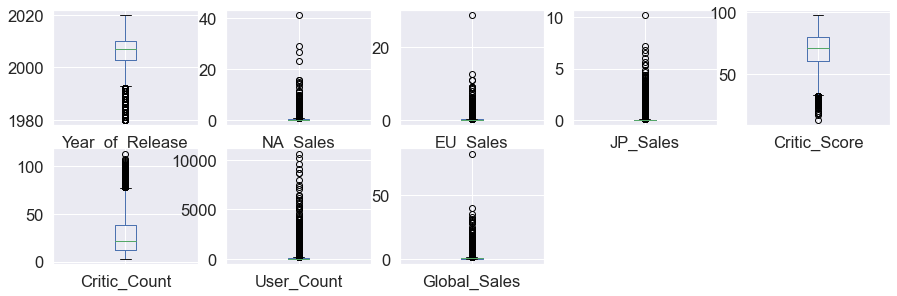

In [69]:
#Visualising Skewness after Removal
cont.plot(kind ='box', subplots = True, layout = (8,5), figsize = (15,20))

 ## Encoding Categorical Variables

In [70]:
from sklearn.preprocessing import LabelEncoder

In [71]:
enc = LabelEncoder()
encodings = catg.apply(enc.fit_transform)
encodings

,Name,Platform,Genre,Publisher,User_Score,Developer,Rating
0,9896,26,10,343,77,955,1
1,8351,11,4,343,96,1577,8
2,4965,26,6,343,80,955,1
3,9898,26,10,343,77,955,1
4,6569,5,7,343,96,1577,8
...,...,...,...,...,...,...,...
14571,7426,17,0,478,96,1577,8
14572,4568,28,10,88,96,1577,8
14573,3443,20,1,220,96,1577,8
14574,8026,6,4,523,96,1577,8


In [219]:
encodings.drop('User_Score',axis=1,inplace=True)

In [72]:
train.drop(columns = ['Name','Platform','Genre','Publisher','Developer','Rating'],axis=1,inplace=True)

In [220]:
df = pd.concat([train,encodings],axis=1)
df.sample(10)

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Global_Sales,Name,Platform,Genre,Publisher,Developer,Rating
6371,1999,0.139762,0.095310,0.000000,69.676,1.410279,3.334886,1.534714,0.239017,260,15,7,20,1577,8
13511,2010,0.000000,0.000000,0.019803,69.676,1.410279,3.334886,1.534714,0.019803,5501,19,1,220,1577,8
3020,2007,0.285179,0.207014,0.000000,86.000,3.761200,7.700000,4.852030,0.512824,9574,17,8,312,467,5
13469,2014,0.000000,0.000000,0.019803,69.676,1.410279,3.334886,1.534714,0.019803,4252,27,0,331,1577,8
22,1988,2.355178,1.490654,1.576915,69.676,1.410279,3.334886,1.534714,2.905808,8353,11,4,343,1577,8
4141,2015,0.322083,0.039221,0.000000,79.000,3.332205,6.400000,4.007333,0.385262,7160,30,3,205,610,7
13512,2008,0.000000,0.019803,0.000000,62.000,1.945910,4.100000,3.433987,0.019803,5807,13,10,133,409,2
4748,2000,0.207014,0.139762,0.000000,84.000,2.484907,8.500000,1.945910,0.343590,4470,15,2,133,425,7
10484,2009,0.000000,0.067659,0.000000,69.676,1.410279,8.200000,2.484907,0.086178,1554,13,8,133,452,5
5083,1994,0.076961,0.058269,0.190620,69.676,1.410279,3.334886,1.534714,0.314811,4363,15,8,435,1577,8


# Model Building

## Splitting Dataset

In [221]:
X = df.drop('Global_Sales',axis = 1)
y = df['Global_Sales']

In [222]:
#Splitting Dataset into Trainin(80%) and Testing(20%) Data.
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.2)

## Linear Regression Model

In [223]:
#Model instantiating and fitting
lm = LinearRegression()

lm.fit(X_train,y_train)

LinearRegression()

In [224]:
#Printing model confidence on training set and testing set
print("Linear Regression Model Confidence on training set : ",round(lm.score(X_train,y_train)*100,2),'%')
print("Linear Regression Model Confidence on testing set : ",round(lm.score(X_test,y_test)*100,2),'%')

Linear Regression Model Confidence on training set :  95.38 %
Linear Regression Model Confidence on testing set :  95.52 %


In [225]:
#Performing Model Predictions on X_test
y_pred = lm.predict(X_test)

In [226]:
#printing Intercept and weights our Linear Regression Model
print("Intercept for Linear Regression Model is : ",lm.intercept_,'\n')
weights = zip(X.columns,lm.coef_)
weights = pd.DataFrame(list(weights), columns = ['features', 'coefficients'])
print("Features and their corresponding weights:")
weights

Intercept for Linear Regression Model is :  4.191815107716109 

Features and their corresponding weights:


,features,coefficients
0,Year_of_Release,-2.100790e-03
1,NA_Sales,7.919595e-01
2,EU_Sales,6.121224e-01
3,JP_Sales,5.419091e-01
4,Critic_Score,6.903160e-04
5,Critic_Count,9.351905e-04
6,User_Score,1.195018e-03
7,User_Count,1.278473e-02
8,Name,1.117573e-07
9,Platform,5.055450e-04


In [227]:
#Applying Evaluation metrics to our Regression model
print('R squared for our Linear Regression Model:', r2_score(y_test,y_pred))
print('Mean Absolute Error for our Linear Regression Model:',mean_absolute_error(y_test,y_pred))
print('Mean Squared Error for our Linear Regression Model:',mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error for our Linear Regression Model:',np.sqrt(mean_squared_error(y_test,y_pred)))

R squared for our Linear Regression Model: 0.9552173826610447
Mean Absolute Error for our Linear Regression Model: 0.05443913533791696
Mean Squared Error for our Linear Regression Model: 0.00700992506644441
Root Mean Squared Error for our Linear Regression Model: 0.08372529526041941


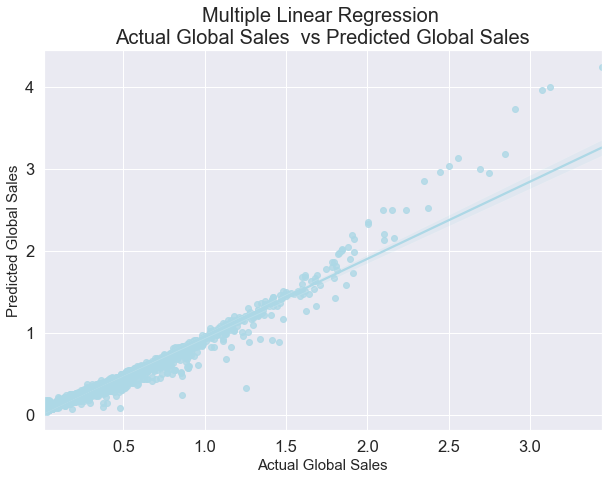

In [228]:
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=y_pred,data=X, color = 'lightblue')
plt.xlabel('Actual Global Sales',fontsize = 15)
plt.ylabel('Predicted Global Sales', fontsize = 15)
plt.title('Multiple Linear Regression \nActual Global Sales  vs Predicted Global Sales',fontsize = 20)
plt.show()

## Decision Tree Regressor

In [229]:
#Model instantiating and fitting

dt = DecisionTreeRegressor()
dt.fit(X_train,y_train)

DecisionTreeRegressor()

In [230]:
#Applying Evaluation metrics to our Regression model
prd = dt.predict(X_test)

print('R squared for our Linear Regression Model:', r2_score(y_test,prd))
print('Mean Absolute Error for our Linear Regression Model:',mean_absolute_error(y_test,prd))
print('Mean Squared Error for our Linear Regression Model:',mean_squared_error(y_test,prd))
print('Root Mean Squared Error for our Linear Regression Model:',np.sqrt(mean_squared_error(y_test,prd)))

R squared for our Linear Regression Model: 0.9834971079056617
Mean Absolute Error for our Linear Regression Model: 0.01880536777564258
Mean Squared Error for our Linear Regression Model: 0.002583235278218072
Root Mean Squared Error for our Linear Regression Model: 0.050825537657934045


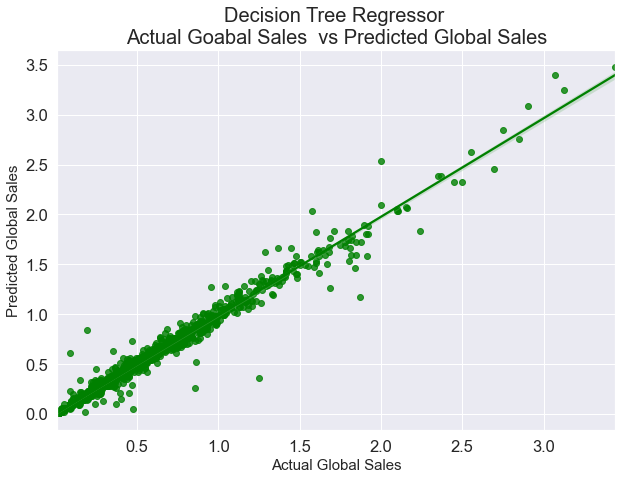

In [231]:
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=prd,data=X, color = 'green')
plt.xlabel('Actual Global Sales',fontsize = 15)
plt.ylabel('Predicted Global Sales', fontsize = 15)
plt.title('Decision Tree Regressor \nActual Goabal Sales  vs Predicted Global Sales',fontsize = 20)
plt.show()

## Random Forest Regressor

In [232]:
# Model Instantiating and fitting
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
pred = rf.predict(X_test)
r2_score(y_test,pred)

0.9904115958309511

In [233]:
#Applying Evaluation metrics to our Regression model
print('R squared for our Random Forest Regressor Model:', r2_score(y_test,pred))
print('Mean Absolute Error for our Random Forest Regressor Model:',mean_absolute_error(y_test,pred))
print('Mean Squared Error for our Random Forest Regressor Model:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error for our Random Forest Regressor Model:',np.sqrt(mean_squared_error(y_test,pred)))

R squared for our Random Forest Regressor Model: 0.9904115958309511
Mean Absolute Error for our Random Forest Regressor Model: 0.013431502136447249
Mean Squared Error for our Random Forest Regressor Model: 0.0015008947383106186
Root Mean Squared Error for our Random Forest Regressor Model: 0.03874138276198487


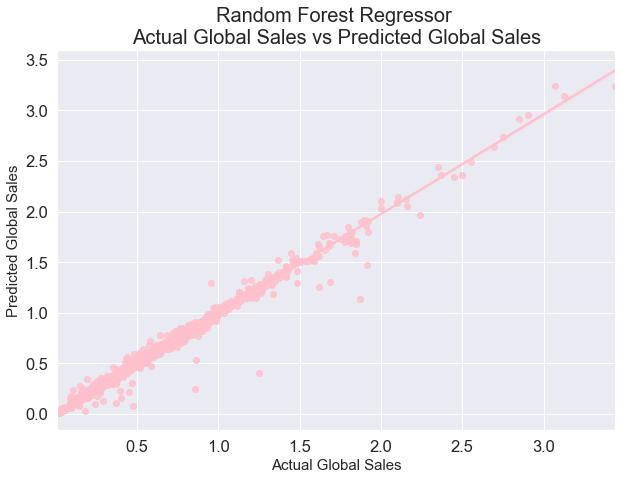

In [234]:
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=pred,data=X, color = 'pink')
plt.xlabel('Actual Global Sales',fontsize = 15)
plt.ylabel('Predicted Global Sales', fontsize = 15)
plt.title('Random Forest Regressor \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## OLS using Stats Model

In [235]:
lm1 = smf.ols(formula = 'y ~ X',data = df).fit()
lm1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.954
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                 2.163e+04
Date:                Sun, 24 Apr 2022   Prob (F-statistic):               0.00
Time:                        23:17:59   Log-Likelihood:                 14644.
No. Observations:               14576   AIC:                        -2.926e+04
Df Residuals:                   14561   BIC:                        -2.914e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.0526      0.273     14.845      0.000       3.518       4.588
X[0]          -0.0020      0.000    -14.948      0.000      -0.002      -0.002
X[1]           0.7829      0.004    195.164      0.000       0.775       0.791
X[2]           0.6282      0.005    118.022      0.000       0.618       0.639
X[3]           0.5474      0.005    113.894      0.000       0.538       0.557
X[4]           0.0007   8.76e-05      7.931      0.000       0.001       0.001
X[5]           0.0027      0.001      1.886      0.059      -0.000       0.006
X[6]           0.0008      0.001      1.459      0.145      -0.000       0.002
X[7]           0.0122      0.001     13.225      0.000       0.010       0.014
X[8]       -5.121e-08   2.47e-07     -0.207      0.836   -5.35e-07    4.33e-07
X[9]           0.0005   9.32e-05      4.965      0.000       0.000       0.001
X[10]          0.0007      0.000      3.599      0.000       0.000       0.001
X[11]      -4.557e-06   4.47e-06     -1.019      0.308   -1.33e-05    4.21e-06
X[12]       7.964e-06   1.88e-06      4.228      0.000    4.27e-06    1.17e-05
X[13]         -0.0009      0.000     -3.060      0.002      -0.002      -0.000
==============================================================================
Omnibus:                     7404.113   Durbin-Watson:                   0.817
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1189966.059
Skew:                          -1.382   Prob(JB):                         0.00
Kurtosis:                      47.178   Cond. No.                     2.35e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.35e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## KNN Regressor

In [236]:
#Model fitting and Instantiating

knn = KNeighborsRegressor()
knn.fit(X_train,y_train)

KNeighborsRegressor()

In [237]:
print("Model Confidence on training Dataset: ",knn.score(X_train,y_train)*100,'%')
print("Model Confidence on test Dataset:",knn.score(X_test,y_test)*100,'%')

Model Confidence on training Dataset:  53.35573028771926 %
Model Confidence on test Dataset: 23.11879946183043 %


In [238]:
knnpred  = knn.predict(X_test)
#Applying Evaluation metrics to our KNN Regression model
print('R2 Score for KNN Regression Model:', r2_score(y_test,knnpred))
print('Mean Absolute Error for our KNN Regression Model:',mean_absolute_error(y_test,knnpred))
print('Mean Squared Error for our KNN Regression Model:',mean_squared_error(y_test,knnpred))
print('Root Mean Squared Error for our KNN Regression Model:',np.sqrt(mean_squared_error(y_test,knnpred)))

R2 Score for KNN Regression Model: 0.2311879946183043
Mean Absolute Error for our KNN Regression Model: 0.23832866157271454
Mean Squared Error for our KNN Regression Model: 0.12034389386215062
Root Mean Squared Error for our KNN Regression Model: 0.34690617443647587


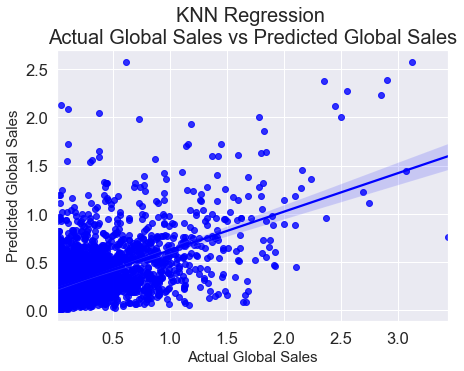

In [239]:
plt.figure(figsize = (7,5))
sns.regplot(x=y_test,y=knnpred,data=X, color = 'blue')
plt.xlabel('Actual Global Sales',fontsize = 15)
plt.ylabel('Predicted Global Sales', fontsize = 15)
plt.title('KNN Regression \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Gradient Boosting Regressor

In [240]:
#Model Instantiating and fitting

gradient = GradientBoostingRegressor()
gradient.fit(X_train,y_train)

GradientBoostingRegressor()

In [241]:
grpred = gradient.predict(X_test)
#Applying Evaluation metrics to our Gradient Boostin Regresser model
print('R2 Score for Gradient Boostin Regresser Model:', r2_score(y_test,grpred))
print('Mean Absolute Error for our Gradient Boostin Regresser Model:',mean_absolute_error(y_test,grpred))
print('Mean Squared Error for our Gradient Boostin Regresser Model:',mean_squared_error(y_test,grpred))
print('Root Mean Squared Error for our Gradient Boostin Regresser Model:',np.sqrt(mean_squared_error(y_test,grpred)))

R2 Score for Gradient Boostin Regresser Model: 0.9922197556793155
Mean Absolute Error for our Gradient Boostin Regresser Model: 0.016093328925729497
Mean Squared Error for our Gradient Boostin Regresser Model: 0.0012178593598902066
Root Mean Squared Error for our Gradient Boostin Regresser Model: 0.034897841765504735


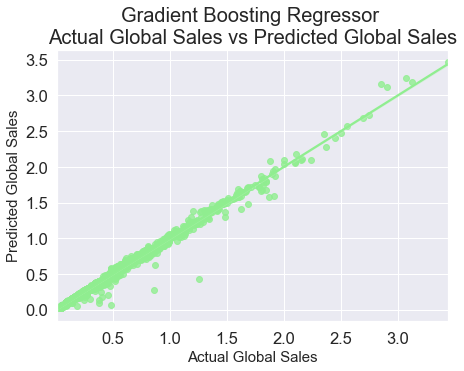

In [242]:
plt.figure(figsize = (7,5))
sns.regplot(x=y_test,y=grpred,data=X, color = 'lightgreen')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Gradient Boosting Regressor \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Bagging Regressor

In [243]:
#Model Instantiating and fitting

bagging = BaggingRegressor()
bagging.fit(X_train,y_train)

BaggingRegressor()

In [244]:
bgpred = bagging.predict(X_test)
#Applying Evaluation metrics to our Gradient Boostin Regresser model
print('R2 Score for Bagging Regresser Model:', r2_score(y_test,bgpred))
print('Mean Absolute Error for our Bagging Regresser Model:',mean_absolute_error(y_test,bgpred))
print('Mean Squared Error for our Bagging Regresser Model:',mean_squared_error(y_test,bgpred))
print('Root Mean Squared Error for our Bagging Regresser Model:',np.sqrt(mean_squared_error(y_test,bgpred)))

R2 Score for Bagging Regresser Model: 0.9895516315974483
Mean Absolute Error for our Bagging Regresser Model: 0.014666504818153321
Mean Squared Error for our Bagging Regresser Model: 0.0016355068980030622
Root Mean Squared Error for our Bagging Regresser Model: 0.040441400791800745


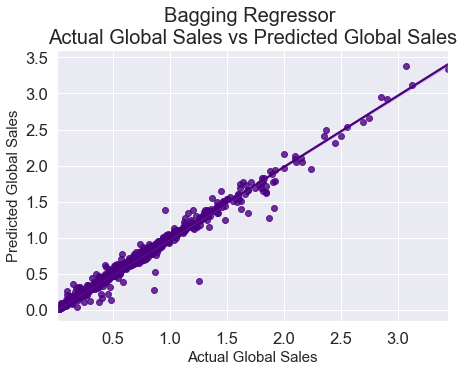

In [245]:
plt.figure(figsize = (7,5))
sns.regplot(x=y_test,y=bgpred,data=X, color = 'indigo')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Bagging Regressor \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Adaptive Boost Regressor

In [246]:
#Model Instantiating and fitting

ada = AdaBoostRegressor()
ada.fit(X_train,y_train)

AdaBoostRegressor()

In [247]:
adapred = ada.predict(X_test)
#Applying Evaluation metrics to our Gradient Boostin Regresser model
print('R2 Score for Adaptive Boostin Regresser Model:', r2_score(y_test,adapred))
print('Mean Absolute Error for our Adaptive Boostin Regresser Model:',mean_absolute_error(y_test,adapred))
print('Mean Squared Error for our Adaptive Boostin Regresser Model:',mean_squared_error(y_test,adapred))
print('Root Mean Squared Error for our Adaptive Boostin Regresser Model:',np.sqrt(mean_squared_error(y_test,adapred)))

R2 Score for Adaptive Boostin Regresser Model: 0.792978586572833
Mean Absolute Error for our Adaptive Boostin Regresser Model: 0.1609108114710492
Mean Squared Error for our Adaptive Boostin Regresser Model: 0.03240553325165926
Root Mean Squared Error for our Adaptive Boostin Regresser Model: 0.18001536948732813


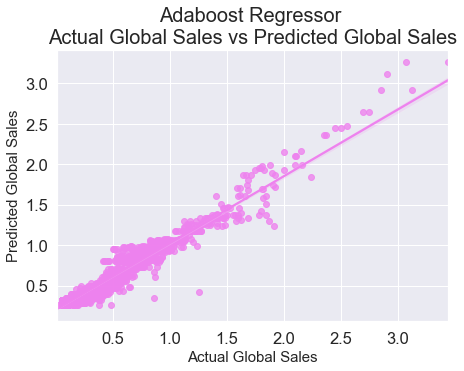

In [248]:
plt.figure(figsize = (7,5))
sns.regplot(x=y_test,y=adapred,data=X, color = 'violet')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Adaboost Regressor \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Regularization with Ridge

In [249]:
#Ridge will return best alpha and coefficients after performing 10 cross validations
ridgecv = RidgeCV(alphas= np.arange(0.001,0.2,0.001),normalize=True)
ridgecv.fit(X_train,y_train)

RidgeCV(alphas=array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009,
       0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017, 0.018,
       0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026, 0.027,
       0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035, 0.036,
       0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044, 0.045,
       0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053, 0.054,
       0.055, 0.0...
       0.136, 0.137, 0.138, 0.139, 0.14 , 0.141, 0.142, 0.143, 0.144,
       0.145, 0.146, 0.147, 0.148, 0.149, 0.15 , 0.151, 0.152, 0.153,
       0.154, 0.155, 0.156, 0.157, 0.158, 0.159, 0.16 , 0.161, 0.162,
       0.163, 0.164, 0.165, 0.166, 0.167, 0.168, 0.169, 0.17 , 0.171,
       0.172, 0.173, 0.174, 0.175, 0.176, 0.177, 0.178, 0.179, 0.18 ,
       0.181, 0.182, 0.183, 0.184, 0.185, 0.186, 0.187, 0.188, 0.189,
       0.19 , 0.191, 0.192, 0.193, 0.194, 0.195, 0.196, 0.197, 0.198,
       0.199]),
        normalize=True)

In [250]:
ridge_model = Ridge(alpha=ridgecv.alpha_)
ridge_model.fit(X_train,y_train)

Ridge(alpha=0.003)

In [251]:
#Applying Evaluation metrics to our Tuned Ridge Regression model
ridgepred = ridge_model.predict(X_test)

print('R2 Score for Tuned Ridge Regression Model:', r2_score(y_test,ridgepred))
print('Mean Absolute Error for our Tuned Ridge Regression Model:',mean_absolute_error(y_test,ridgepred))
print('Mean Squared Error for our Tuned Ridge Regression Model:',mean_squared_error(y_test,ridgepred))
print('Root Mean Squared Error for our Ridge Linear Regression Model:',np.sqrt(mean_squared_error(y_test,ridgepred)))

R2 Score for Tuned Ridge Regression Model: 0.9552172946048358
Mean Absolute Error for our Tuned Ridge Regression Model: 0.05443943078278547
Mean Squared Error for our Tuned Ridge Regression Model: 0.0070099388500833
Root Mean Squared Error for our Ridge Linear Regression Model: 0.08372537757504173


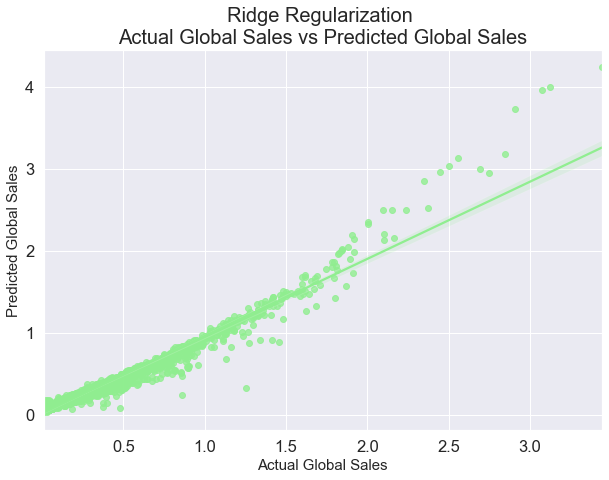

In [252]:
#Plotting Regression Line
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=ridgepred,data=X, color = 'lightgreen')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Ridge Regularization \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Regularization with Lasso

In [253]:
#LassoCV(lasso cross validation) will return the best alpha after max iterations
#normalizing is subtracting the mean and dividing by l2-norm
lasscv = LassoCV(alphas=None, max_iter=2000, normalize = True)
lasscv.fit(X_train,y_train)
alpha = lasscv.alpha_
alpha

3.552090574609423e-06

In [254]:
#Now that we have best parameter, let's use lasso regression and see how well our data has fitted before
alpha = lasscv.alpha_

lasso_reg = Lasso(alpha)
lasso_reg.fit(X_train,y_train)

Lasso(alpha=3.552090574609423e-06)

In [255]:
#Model Confidence After using Lasso Regression
print('Model Confidence After using Lasso Regularization Model: ',round(lasso_reg.score(X_test,y_test),3)*100, '%')

Model Confidence After using Lasso Regularization Model:  95.5 %


In [256]:
#Applying Evaluation metrics to our Tuned Lasso Regression model
lassopred = lasso_reg.predict(X_test)

print('R2 Score for Tuned Lasso Regression Model:', r2_score(y_test,lassopred))
print('Mean Absolute Error for our Tuned Lasso Regression Model:',mean_absolute_error(y_test,lassopred))
print('Mean Squared Error for our Tuned Lasso Regression Model:',mean_squared_error(y_test,lassopred))
print('Root Mean Squared Error for our Lasso Linear Regression Model:',np.sqrt(mean_squared_error(y_test,lassopred)))

R2 Score for Tuned Lasso Regression Model: 0.9552144161807107
Mean Absolute Error for our Tuned Lasso Regression Model: 0.054445380338081335
Mean Squared Error for our Tuned Lasso Regression Model: 0.0070103894163660654
Root Mean Squared Error for our Lasso Linear Regression Model: 0.08372806827083774


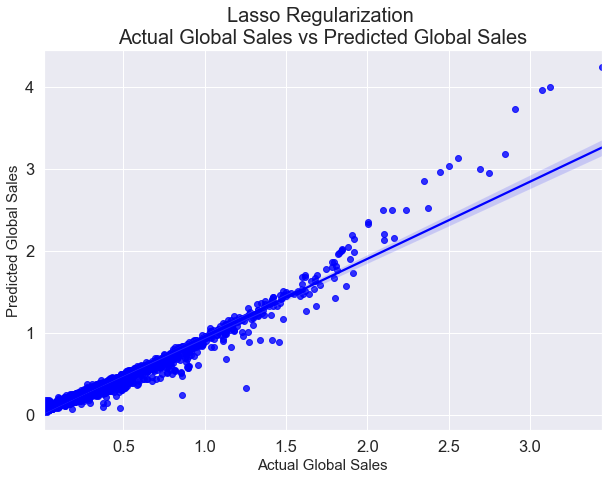

In [257]:
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=lassopred,data=X, color = 'blue')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Lasso Regularization \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Conclusion: 
- According to Least RMSE score our best model is Gradient Boosting Regressor Model with RMSE of 0.0395.

# HyperParameter Tuning

In [265]:
grid = {#'loss':  ['squared_error', 'absolute_error', 'huber', 'quantile'],
        #'n_estimators': [10,20,30,40,50,60,70,80,90],
        'max_depth' : [1,2,5,7,9],
       'learning_rate' : [0.1,0.2,0.3],
       'subsample': [0.1,0.2,0.3,]}
        #'criterion' : ['friedman_mse','squared_error', 'mse', 'mae']}

In [266]:
#Instantiating Randomized SearchCV
randomcv = RandomizedSearchCV(estimator = gradient, param_distributions = grid, 
                              n_iter = 100, cv = 3, verbose=2, random_state=42)

In [267]:
#Fitting our Random Search CV
randomcv.fit(X_train,y_train)

Fitting 3 folds for each of 45 candidates, totalling 135 fits
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.1; total time=   0.7s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.1; total time=   1.2s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.1; total time=   0.9s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.2; total time=   0.9s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.2; total time=   0.9s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.2; total time=   0.9s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.3; total time=   1.1s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.3; total time=   1.4s
[CV] END ......learning_rate=0.1, max_depth=1, subsample=0.3; total time=   1.5s
[CV] END ......learning_rate=0.1, max_depth=2, subsample=0.1; total time=   1.5s
[CV] END ......learning_rate=0.1, max_depth=2, subsample=0.1; total time=   0.9s
[CV] END ......learning_rate=0.1, max_depth=2, 

RandomizedSearchCV(cv=3, estimator=GradientBoostingRegressor(), n_iter=100,
                   param_distributions={'learning_rate': [0.1, 0.2, 0.3],
                                        'max_depth': [1, 2, 5, 7, 9],
                                        'subsample': [0.1, 0.2, 0.3]},
                   random_state=42, verbose=2)

In [268]:
#To check the best parameters to increase model Accuracy
randomcv.best_params_

{'subsample': 0.3, 'max_depth': 9, 'learning_rate': 0.1}

In [269]:
#Model Instantiating and fitting

model = GradientBoostingRegressor(subsample  = 0.3 , max_depth = 9,
                                    learning_rate = 0.1)
model.fit(X_train,y_train)

GradientBoostingRegressor(max_depth=9, subsample=0.3)

In [270]:
pred = model.predict(X_test)
#Applying Evaluation metrics to our Gradient Boostin Regresser model
print('R2 Score for Tuned Gradient Boosting Regresser Model:', r2_score(y_test,pred))
print('Mean Absolute Error for our Tuned Gradient Boosting Regresser Model:',mean_absolute_error(y_test,pred))
print('Mean Squared Error for our  Tuned Gradient Boosting Regresser Model:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error for our Tuned Gradient Boosting Regresser Model:',np.sqrt(mean_squared_error(y_test,pred)))

R2 Score for Tuned Gradient Boosting Regresser Model: 0.9926742573842958
Mean Absolute Error for our Tuned Gradient Boosting Regresser Model: 0.01303307141674724
Mean Squared Error for our  Tuned Gradient Boosting Regresser Model: 0.0011467151730650172
Root Mean Squared Error for our Tuned Gradient Boosting Regresser Model: 0.03386318315021518


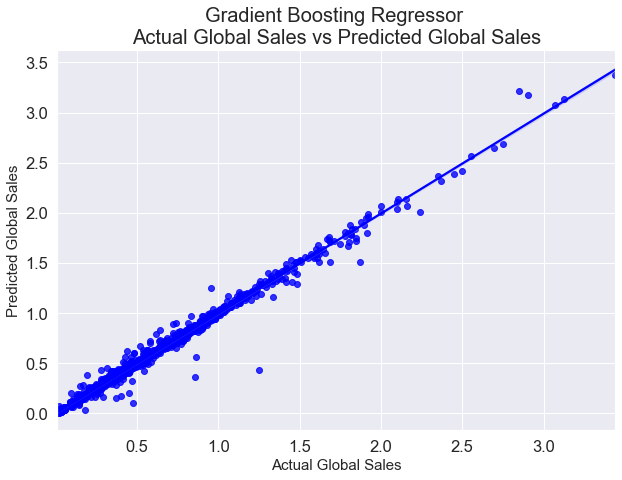

In [271]:
plt.figure(figsize = (10,7))
sns.regplot(x=y_test,y=pred,data=df, color = 'blue')
plt.xlabel('Actual Global Sales', fontsize = 15)
plt.ylabel('Predicted Global Sales',fontsize =15)
plt.title('Gradient Boosting Regressor \nActual Global Sales vs Predicted Global Sales',fontsize = 20)
plt.show()

## Saving Final Model

In [272]:
joblib.dump(model,"GamingGlobalSalesPredictions.pkl")

['GamingGlobalSalesPredictions.pkl']

## Loading Model To Make Predictions

In [273]:
Model = joblib.load("GamingGlobalSalesPredictions.pkl")

## Preparing Test Data for Predictions

In [274]:
test = pd.read_csv("Test.csv")
test.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Nicktoons: MLB,X360,2011.0,Sports,Take-Two Interactive,0.12,0.00,0.0,NaN,NaN,7.6,7.0,High Voltage Software,E
1,Shonen Jump's One Piece: Grand Battle,PS2,2005.0,Fighting,Atari,0.07,0.05,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,Learn Math,DS,2009.0,Puzzle,DreamCatcher Interactive,0.12,0.00,0.0,NaN,NaN,tbd,NaN,Dreamcatcher,E
3,Nitrobike,Wii,2008.0,Racing,Ubisoft,0.11,0.01,0.0,49.0,22.0,7.1,7.0,Left Field Productions,E10+
4,Cruise Ship Vacation Games,Wii,2009.0,Puzzle,Avanquest,0.12,0.00,0.0,NaN,NaN,tbd,NaN,Activision,E


In [275]:
# Shape of Train dataset
print('Shape of our Dataset is Rows: {} Columns: {}'.format(test.shape[0], test.shape[1]))

Shape of our Dataset is Rows: 2143 Columns: 14


In [276]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2143 entries, 0 to 2142
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             2143 non-null   object 
 1   Platform         2143 non-null   object 
 2   Year_of_Release  2106 non-null   float64
 3   Genre            2143 non-null   object 
 4   Publisher        2138 non-null   object 
 5   NA_Sales         2143 non-null   float64
 6   EU_Sales         2143 non-null   float64
 7   JP_Sales         2143 non-null   float64
 8   Critic_Score     920 non-null    float64
 9   Critic_Count     920 non-null    float64
 10  User_Score       1255 non-null   object 
 11  User_Count       794 non-null    float64
 12  Developer        1267 non-null   object 
 13  Rating           1246 non-null   object 
dtypes: float64(7), object(7)
memory usage: 234.5+ KB


In [277]:
#Checking for duplicate rows

test.duplicated().sum()

0

In [194]:
#Checking for null values

print("\nMissing values in our features:\n \n",test.isna().sum())


Missing values in our features:
 
 Name                  0
Platform              0
Year_of_Release      37
Genre                 0
Publisher             5
NA_Sales              0
EU_Sales              0
JP_Sales              0
Critic_Score       1223
Critic_Count       1223
User_Score          888
User_Count         1349
Developer           876
Rating              897
dtype: int64


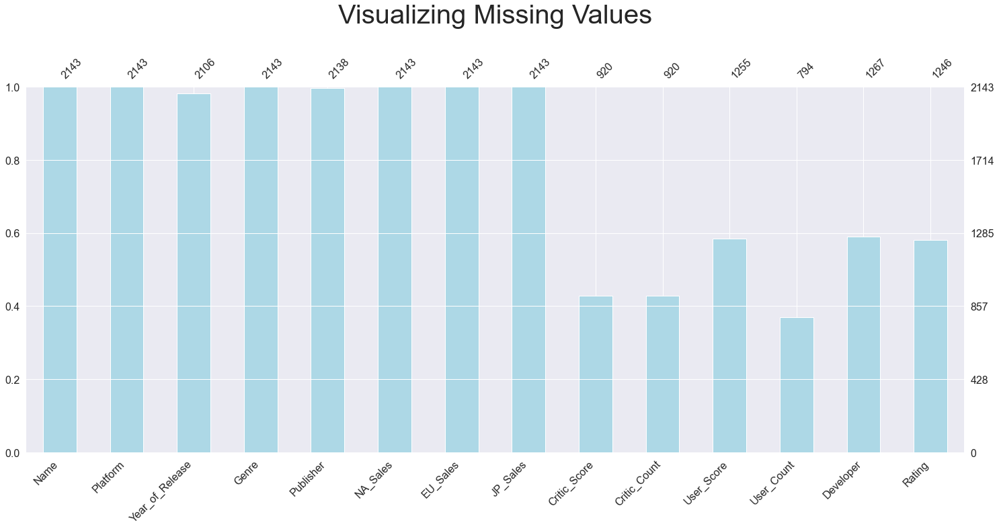

In [195]:
#Visualizing missing values
plt.figure(figsize = (10,15))
msno.bar(test,color = 'lightblue')
plt.title("Visualizing Missing Values\n", fontsize = 40)
plt.show()

In [196]:
#Statistical Analysis of Numerical Data

test.describe()


,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Count
count,2106.000000,2143.000000,2143.000000,2143.000000,920.000000,920.000000,794.000000
mean,2006.829535,0.043999,0.016253,0.022804,63.410870,18.898913,74.214106
std,5.316215,0.036211,0.020982,0.038525,13.981594,12.320334,396.643314
min,1981.000000,0.000000,0.000000,0.000000,19.000000,4.000000,4.000000
25%,2004.000000,0.000000,0.000000,0.000000,55.000000,9.000000,7.000000
50%,2008.000000,0.050000,0.010000,0.000000,65.000000,17.000000,12.000000
75%,2011.000000,0.070000,0.030000,0.060000,73.000000,25.000000,27.000000
max,2016.000000,0.120000,0.130000,0.130000,92.000000,77.000000,9851.000000


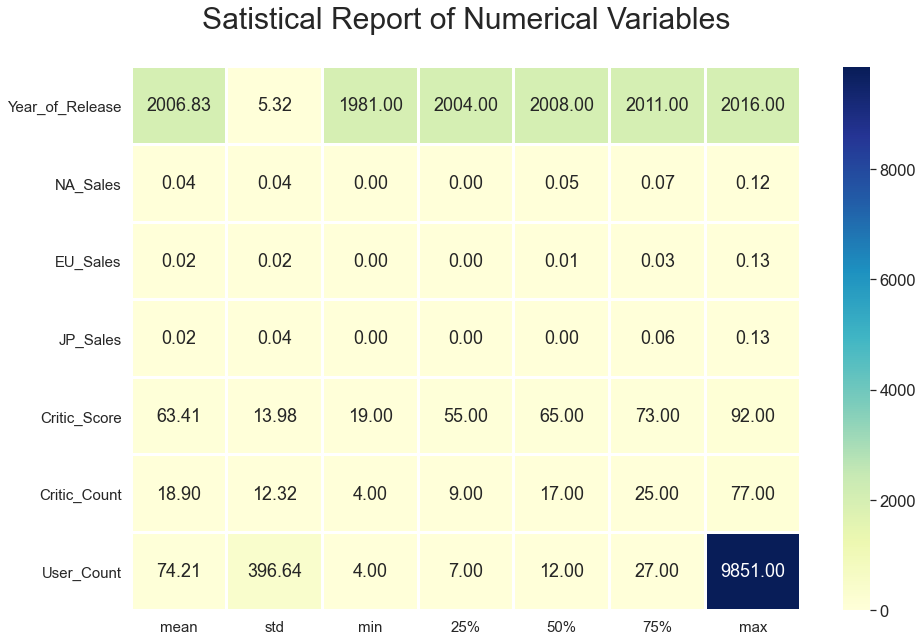

In [197]:
#visualizing statistical description of dataset
plt.figure(figsize = (15,10))
sns.heatmap(round(test.describe()[1:].transpose(),2),linewidth = 2,annot= True, fmt = "0.2f",cmap='YlGnBu')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.title("Satistical Report of Numerical Variables\n",fontsize = 30)
plt.show()

## Cleaning Test Data

In [198]:
test.User_Score.fillna('tbd',inplace= True)
test.User_Score.replace('tbd',0,inplace = True)
test['User_Score'] = test.User_Score.astype('float64')

In [199]:
(test['User_Score']).mean()

2.5524031731217933

In [200]:
(test['User_Score']) = (test['User_Score']).replace(0,(test['User_Score']).mean())

In [201]:
test.isna().sum()

Name                  0
Platform              0
Year_of_Release      37
Genre                 0
Publisher             5
NA_Sales              0
EU_Sales              0
JP_Sales              0
Critic_Score       1223
Critic_Count       1223
User_Score            0
User_Count         1349
Developer           876
Rating              897
dtype: int64

In [202]:
print("Mode for Publisher:         ",test['Publisher'].mode())
print("\nMode for Year_of_Release:   ",test['Year_of_Release'].mode())
print("\nMode for Rating:            ",test['Rating'].mode())
print("\nMode for Developer:         ",test['Developer'].mode())

print("\nMean for Critic_Score:      ",test['Critic_Score'].mean())
print("\nMean for Critic_Count:      ",test['Critic_Count'].mean())
print("\nMean for User_Count:        ",test['User_Count'].mean())

Mode for Publisher:          0    Namco Bandai Games
dtype: object

Mode for Year_of_Release:    0    2008.0
dtype: float64

Mode for Rating:             0    E
dtype: object

Mode for Developer:          0    Ubisoft
dtype: object

Mean for Critic_Score:       63.41086956521739

Mean for Critic_Count:       18.89891304347826

Mean for User_Count:         74.21410579345088


In [203]:
#Imputing Categorical Values with mode

test['Publisher'] = test['Publisher'].replace(np.nan,'Namco Bandai Games')
test['Developer'] = test['Developer'].replace(np.nan,'Unknown')
test['Year_of_Release'] = test['Year_of_Release'].replace(np.nan,2008)


#Imputing Continuous Values with mean
test['Critic_Score'] = test['Critic_Score'].replace(np.nan,63.4108)
test['Critic_Count'] = test['Critic_Count'].replace(np.nan,18.8989)
test['User_Count'] = test['User_Count'].replace(np.nan,74.2141)

#Replacing Nans For Ratings with a Unique Identifier 'TBD' (To be disclosed) according to ESRP Ratings
test['Rating'] = test['Rating'].replace(np.nan,'TBD')

In [204]:
test['Year_of_Release'] = test['Year_of_Release'].astype('int')

In [205]:
test.isna().sum()

Name               0
Platform           0
Year_of_Release    0
Genre              0
Publisher          0
NA_Sales           0
EU_Sales           0
JP_Sales           0
Critic_Score       0
Critic_Count       0
User_Score         0
User_Count         0
Developer          0
Rating             0
dtype: int64

In [206]:
catg_test = test.select_dtypes('object')

## Encoding Test Dataset

In [207]:
enc = LabelEncoder()
encodings_test = catg_test.apply(enc.fit_transform)
encodings_test

,Name,Platform,Genre,Publisher,Developer,Rating
0,1162,23,10,232,240,0
1,1495,13,2,27,572,5
2,902,3,5,63,157,0
3,1176,21,6,247,305,1
4,320,21,5,31,20,0
...,...,...,...,...,...,...
2138,1768,3,1,19,605,3
2139,1430,11,7,22,37,3
2140,341,21,3,139,572,5
2141,29,23,0,133,596,1


In [208]:
test.drop(columns = ['Name','Platform','Genre','Publisher','Developer','Rating'],axis=1,inplace=True)

test1 = pd.concat([test,encodings_test],axis=1)
test1.sample(10)

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Name,Platform,Genre,Publisher,Developer,Rating
1344,1995,0.00,0.00,0.07,63.4108,18.8989,2.552403,74.2141,692,18,6,205,572,5
267,2011,0.07,0.00,0.04,63.4108,18.8989,2.552403,74.2141,683,16,7,29,572,5
105,2005,0.12,0.00,0.00,54.0000,26.0000,7.200000,22.0000,356,16,8,69,435,3
903,1998,0.00,0.00,0.08,63.4108,18.8989,2.552403,74.2141,372,20,10,4,572,5
1303,2005,0.00,0.00,0.07,63.4108,18.8989,2.552403,74.2141,677,16,0,164,572,5
1054,2009,0.00,0.00,0.08,43.0000,6.0000,6.700000,6.0000,88,16,9,83,200,4
1417,2004,0.04,0.03,0.00,65.0000,27.0000,7.800000,17.0000,1473,13,8,99,102,3
501,2010,0.11,0.00,0.00,63.4108,18.8989,2.552403,74.2141,663,21,8,2,510,1
1592,2005,0.01,0.05,0.00,83.0000,54.0000,8.700000,489.0000,532,11,7,151,309,3
1728,2014,0.00,0.05,0.01,83.0000,4.0000,7.900000,47.0000,1680,15,0,2,177,4


In [209]:
test1.skew()

Year_of_Release    -0.582655
NA_Sales            0.228765
EU_Sales            1.609499
JP_Sales            1.424395
Critic_Score       -0.877903
Critic_Count        1.649073
User_Score          0.888121
User_Count         32.167352
Name                0.001455
Platform            0.021934
Genre               0.096710
Publisher          -0.180341
Developer          -0.791988
Rating             -0.562394
dtype: float64

In [210]:
test1['User_Count'] = np.log(test1['User_Count'])

In [211]:
test1.skew()

Year_of_Release   -0.582655
NA_Sales           0.228765
EU_Sales           1.609499
JP_Sales           1.424395
Critic_Score      -0.877903
Critic_Count       1.649073
User_Score         0.888121
User_Count        -0.609718
Name               0.001455
Platform           0.021934
Genre              0.096710
Publisher         -0.180341
Developer         -0.791988
Rating            -0.562394
dtype: float64

# Making Predictions on Test Dataset

In [278]:
#predicting test data using loaded model and saving the results in a dataframe
prediction = Model.predict(test1)
prediction = pd.DataFrame(prediction)

In [279]:
prediction = np.exp(prediction)

In [280]:
#Creating a dataset of Actual vs Predicted Datapoints
Global_Sales = pd.DataFrame({})
Global_Sales['Actual_Global_Sales'] = y[:2143]
Global_Sales['Predicted_Global_Sales'] = prediction
Global_Sales

,Actual_Global_Sales,Predicted_Global_Sales
0,4.425206,1.166793
1,3.719409,1.127929
2,3.597860,1.164215
3,3.519573,1.173532
4,3.477232,1.191217
...,...,...
2138,0.672944,1.062453
2139,0.672944,1.050741
2140,0.672944,1.091404
2141,0.672944,1.052276
